# Try to add a nifty model for sampling the input map

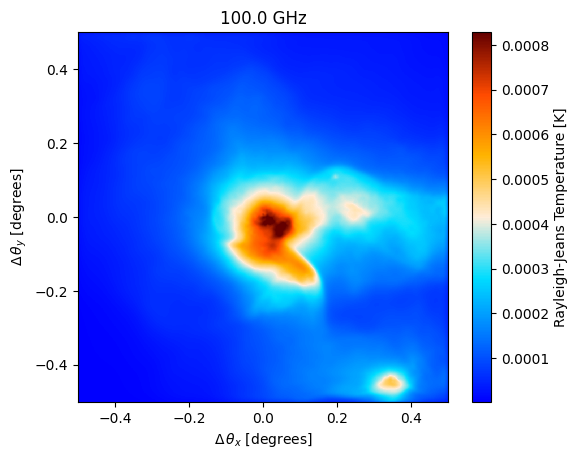

In [1]:
import scipy as sp
import numpy as np
import matplotlib.pyplot as plt
import maria

import jax.numpy as jnp

map_filename = maria.io.fetch("maps/big_cluster.fits")

# load in the map from a fits file
input_map = maria.map.read_fits(filename=map_filename,
                                width=1., #degrees
                                index=1,
                                center=(300.0, -10.0), #RA and Dec in degrees
                                units ='Jy/pixel'
                               )

input_map.to(units="K_RJ").plot()

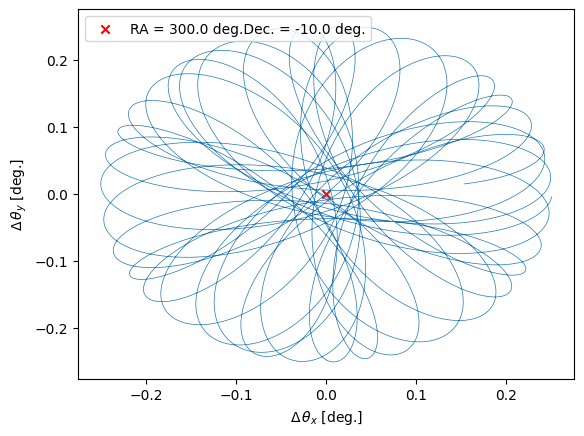

In [2]:
plan = maria.get_plan(scan_pattern="daisy",
                      scan_options={"radius": 0.25, "speed": 0.5}, # in degrees
                    # scan_options={"radius": 0.25, "speed": 0.18}, # in degrees
                      duration=60, # in seconds
                      sample_rate=225, # in Hz
                      start_time = "2022-08-10T06:00:00",
                      scan_center=(300.0, -10.0),
                      frame="ra_dec")
plan.plot()

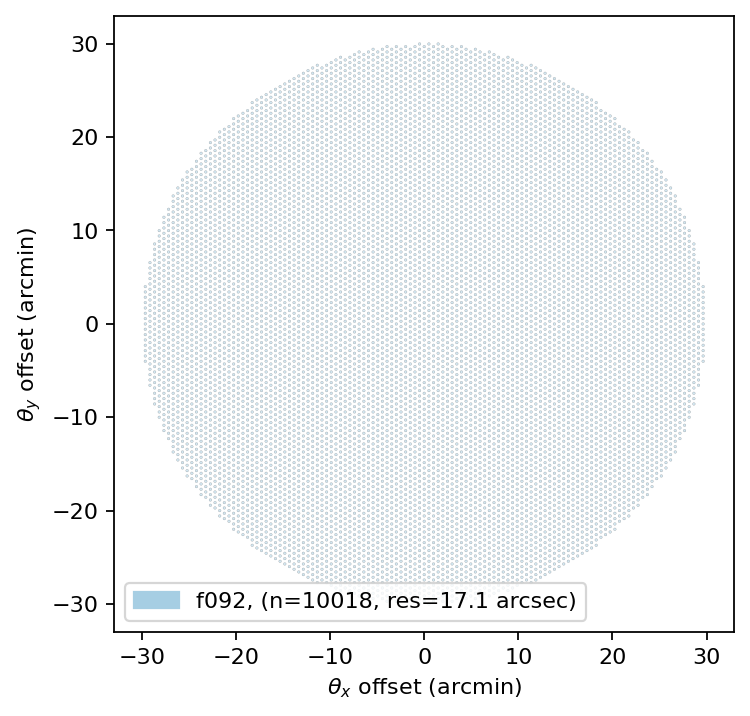

In [3]:
from maria.instrument import Band

f090 = Band(center=92, # in GHz
            width=40.0,
            knee=1,
            sensitivity=6e-5) # in K sqrt(s)

array = {"field_of_view": 1.0, "bands": [f090]}
instrument = maria.get_instrument(array=array, primary_size=50, beam_spacing = 2)
instrument.plot()

In [4]:
sim_truthmap = maria.Simulation(instrument, 
                                plan=plan,
                                site="llano_de_chajnantor", 
                                map=input_map,
                                # noise=False,
                                # atmosphere="2d",
                                # cmb="generate",
                                )

tod_truthmap = sim_truthmap.run()

2024-10-02 09:10:51.208 INFO: Constructed instrument.
2024-10-02 09:10:51.209 INFO: Constructed plan.
2024-10-02 09:10:51.210 INFO: Constructed site.
2024-10-02 09:10:51.883 INFO: Constructed boresight.
2024-10-02 09:10:57.539 INFO: Constructed offsets.


Initialized base in 6331 ms.


Sampling map (f092): 100%|██████████| 1/1 [01:37<00:00, 97.05s/it]


In [5]:
dx, dy = sim_truthmap.coords.offsets(frame=sim_truthmap.map.frame, center=sim_truthmap.map.center)
dx = dx.compute()
dy = dy.compute()

In [6]:
from maria.map.mappers import BinMapper

# Run mapper without any filtering to get noisy mimge
mapper_truthmap = BinMapper(center=(300.0, -10.0),
                   frame="ra_dec",
                   width=1.,
                   height=1.,
                   resolution=np.degrees(np.nanmin(instrument.fwhm))/4.,
                #    tod_postprocessing={
                #         "window": {"tukey": {"alpha": 0.1}},
                #         "remove_modes": {"n": 1},
                #         "highpass": {"f": 0.05},
                #         "despline": {"spacing": 10},
                #     },
                    map_postprocessing={
                        "gaussian_filter": {"sigma": 0},
                        # "gaussian_filter": {"sigma": 1},
                        # "median_filter": {"size": 1},
                    },
                  )

# mapper_truthmap = BinMapper(center=(150, 10), frame="ra_dec", width=0.1, height=0.1, resolution=2e-4, map_postprocessing={"gaussian_filter": {"sigma": 0}} )
mapper_truthmap.add_tods(tod_truthmap)
output_truthmap = mapper_truthmap.run()

mapdata_truth = np.float64(sim_truthmap.map.data)
mapdata_truth = np.nan_to_num(mapdata_truth, nan=np.nanmean(mapdata_truth)) # replace nan value by img mean

print("mapdata_truth shape:", mapdata_truth.shape)
print("mapdata_truth mean:", mapdata_truth.mean())

Running mapper (f092): 100%|██████████| 1/1 [01:52<00:00, 112.31s/it]

mapdata_truth shape: (1, 1024, 1024)
mapdata_truth mean: 0.00013284593853240577


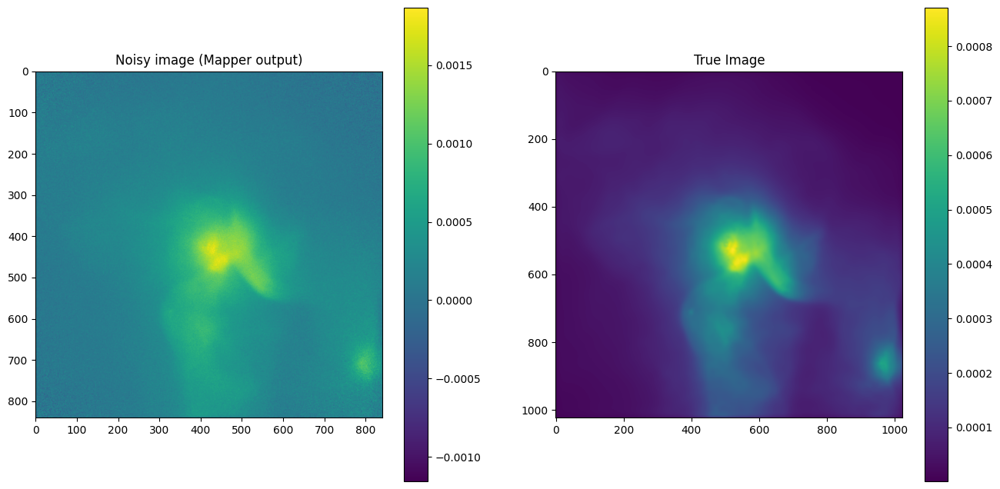

In [7]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(output_truthmap.data[0])
fig.colorbar(im0)
axes[0].title.set_text("Noisy image (Mapper output)")

im1 = axes[1].imshow(mapdata_truth[0])
fig.colorbar(im1)
axes[1].title.set_text("True Image")

plt.show()

# Re-implement map sampling in JAX for nifty response function:

In [8]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '2'
# os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'
# os.environ['XLA_PYTHON_CLIENT_MEM_FRACTION'] = '.99'

import jax
import nifty8.re as jft
import matplotlib.pyplot as plt

from jax import random

seed = 42
key = random.PRNGKey(seed)

2024-10-02 09:16:08.174 INFO: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-10-02 09:16:08.176 INFO: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


In [9]:
# jax compatible rewrite if beams.separably_filter
@jax.jit
def separably_filter(data, F, tol=1e-2, return_filter=False):
    """
    This is more efficient than 2d convolution
    """

    assert data.ndim == 2

    u, s, v = jax.numpy.linalg.svd(F)
    effective_filter = 0
    filtered_image = 0

    # pad data array to achieve mirroring effect
    data = jax.numpy.column_stack([data[:,0], data, data[:, -1]]) # axis=1
    data = jax.numpy.vstack([data[0], data, data[-1]]) # axis=0

    for m in range(len(F)):
        effective_filter += s[m] * u[:, m : m + 1] @ v[m : m + 1]
        
        # Turn kernels into shape (1, dim) to work in nd function
        u_kernel = jax.numpy.broadcast_to(u[:, m], (1, u[:, m].size))
        v_kernel = jax.numpy.broadcast_to(u[:, m], (1, v[m].size))
        
        filtered_image += s[m] * jax.scipy.signal.convolve(jax.scipy.signal.convolve(data, u_kernel.T, mode='same'), v_kernel, mode='same')[1:-1, 1:-1]

    return (filtered_image, effective_filter) if return_filter else filtered_image

In [10]:
@jax.jit
def construct_beam_filter(fwhm, res, buffer=1):
    """
    Make a beam filter for an image.
    """

    # if beam_profile is None:
    #     # beam_profile = lambda r, r0: np.where(r <= r0, 1., 0.)

    #     # a top hat
    #     def beam_profile(r, r0):
    #         return np.exp(-((r / r0) ** 16))

    filter_width = buffer * fwhm

    # n_side = jax.numpy.maximum(filter_width / res, 3).astype(int) # n_side = 3

    filter_side = jax.numpy.linspace(-filter_width / 2, filter_width / 2, 3)
    X, Y = jax.numpy.meshgrid(filter_side, filter_side, indexing="ij")
    R = jax.numpy.sqrt(jax.numpy.square(X) + jax.numpy.square(Y))
    F = jax.numpy.exp(-((R / (fwhm / 2)) ** 16))

    return F / F.sum()

In [11]:
from maria.constants import k_B
from maria.instrument import beams

@jax.jit
def sample_maps(sim_truthmap, dx, dy, resolution, x_side, y_side):

    data_map = jax.numpy.array(1e-16 * np.random.standard_normal(size=dx.shape))
    pbar = instrument.bands

    for band in pbar:
        band_mask = instrument.dets.band_name == band.name

        nu = jax.numpy.linspace(band.nu_min, band.nu_max, 64)
        TRJ = jax.scipy.interpolate.RegularGridInterpolator(
            (jax.numpy.array([100.]),),
            sim_truthmap,
            fill_value=None,
            bounds_error=False,
            method='nearest',
        )(nu)


        nu_passband = jax.numpy.exp(jax.numpy.log(0.5) * (2 * (nu - 90.) / 30.) ** 2)
        power_map = (
            1e12
            * k_B
            * jax.numpy.trapezoid(nu_passband[:, None, None] * TRJ, axis=0, x=1e9 * nu)
        )

        # nu is in GHz, f is in Hz
        nu_fwhm = beams.compute_angular_fwhm(
            # fwhm_0=sim_truthmap.instrument.dets.primary_size.mean(),
            fwhm_0=instrument.dets.primary_size.mean(),
            z=np.inf,
            f=1e9 * band.center,
        ) 
        
        nu_map_filter = construct_beam_filter(fwhm=nu_fwhm, res=resolution)
        filtered_power_map = separably_filter(power_map, nu_map_filter)
        
        # jax:
        map_power = jax.scipy.interpolate.RegularGridInterpolator(
            # Need to invert x_side and y_side for jax interpolation:
            # (jax.numpy.flip(x_side), jax.numpy.flip(y_side)), # length N=2 sequence of arrays with grid coords
            (x_side, y_side), # length N=2 sequence of arrays with grid coords
            # jax.numpy.flip(sim_truthmap[0]),
            # jax.numpy.flip(filtered_power_map), # N=2-dimensional array specifying grid values (1000, 1000)
            filtered_power_map, # N=2-dimensional array specifying grid values (1000, 1000)
            fill_value=0.,
            bounds_error=False,
            method="linear",
        )((jax.numpy.array(dx[band_mask]), jax.numpy.array(dy[band_mask])))

        # jax.debug.print("Total map power: {pwr}", pwr=map_power.sum())

        # data["map"][band_mask] += map_power
        data_map = data_map.at[band_mask].add(map_power)
        
    # return sim_truthmap.data["map"]
    return data_map

## Test TOD agreement for noise-free map

(200, 200)


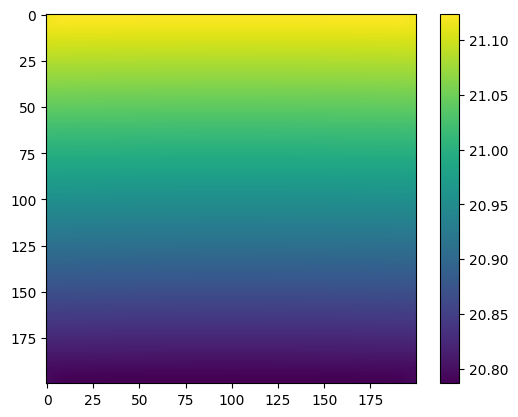

In [12]:
# atmosdata_truth = np.float64(np.load('atmosphere.npy')[:, :, 0])*1e-3
atmosdata_truth = np.float64(np.load('atmosphere.npy')[:, :, 0])

# pad img with average
# atmosdata_truth = np.pad(atmosdata_truth, pad_width=5, mode='constant', constant_values=atmosdata_truth.mean())

print(atmosdata_truth.shape)
plt.imshow(atmosdata_truth)
plt.colorbar()

In [17]:
x_side = np.float64(np.linspace(-0.05, 0.05, 200))
y_side = np.float64(np.linspace(-0.05, 0.05, 200))

# x_side = np.float64(np.linspace(sim_truthmap.map.x_side.min()*2., sim_truthmap.map.x_side.max()*2., 200))
# y_side = np.float64(np.linspace(sim_truthmap.map.y_side.min()*2., sim_truthmap.map.y_side.max()*2., 200)) # Ordering of x_side and y_side matters!

In [18]:
print(sim_truthmap.map.resolution)

1.7044230976507124e-05


In [19]:
mapdata_truth.shape

(1, 1024, 1024)

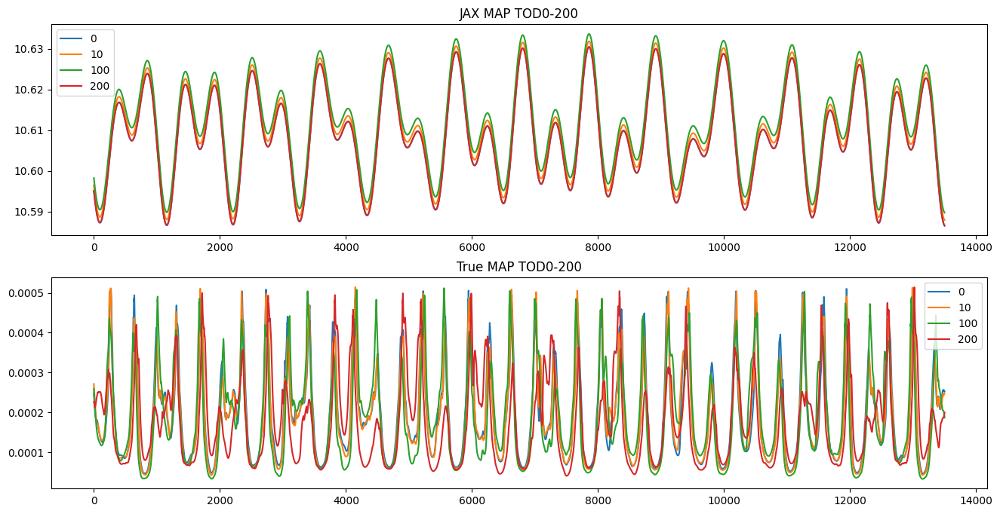

In [20]:
# jax_tods = sample_maps(mapdata_truth, dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)
jax_tods = sample_maps(atmosdata_truth[np.newaxis, :, :], dx, dy, sim_truthmap.map.resolution, x_side, y_side)

fig, axes = plt.subplots(2, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    im0 = axes[0].plot(jax_tods[i], label=i)

    tods_map = np.float64(tod_truthmap.components['map'].compute())
    im1 = axes[1].plot(tods_map[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'True MAP TOD0-{i}')
axes[1].legend()

plt.show()

# Next, initialise nifty prior model

Noise stddev: 0.00028096637


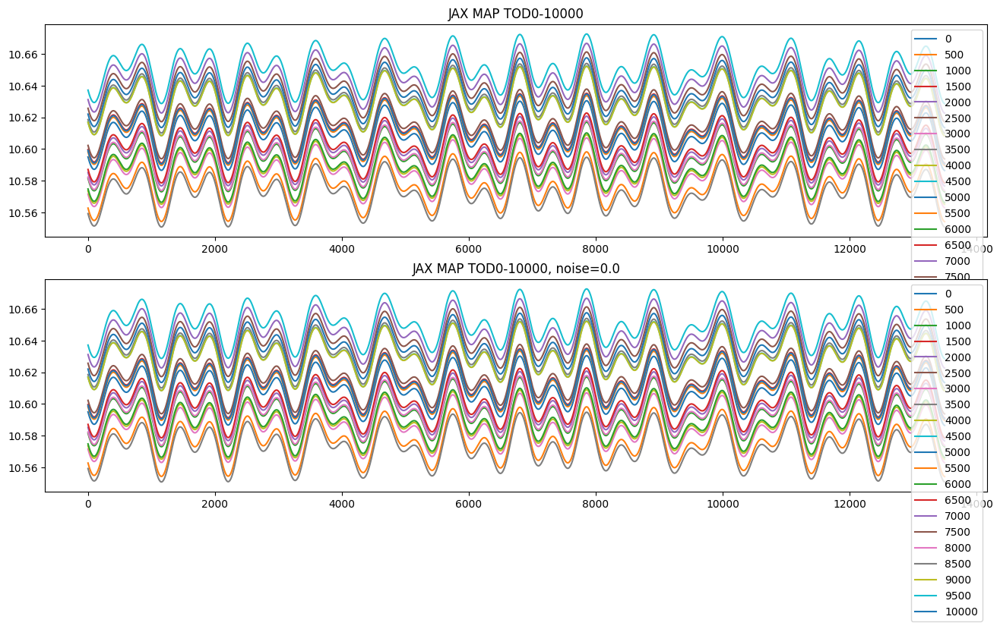

In [21]:
# Pick noise level for rest of run:
noiselevel = 0.0
# noiselevel = 0.1
# noiselevel = 0.5
# noiselevel = 1.0

# jax_tods = sample_maps(mapdata_truth, dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)
noised_jax_tod = jax_tods + np.float64(tod_truthmap.components['noise']*noiselevel)

print("Noise stddev:", np.std(tod_truthmap.components['noise'].compute()))

fig, axes = plt.subplots(2, 1, figsize=(16, 8))

# for i in [0, 10, 100, 200]:
for i in range(0, len(jax_tods), len(jax_tods)//20):
    im0 = axes[0].plot(jax_tods[i], label=i)

    im1 = axes[1].plot(noised_jax_tod[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'JAX MAP TOD0-{i}, noise={noiselevel}')
axes[1].legend()

plt.show()

In [22]:
# dims = (1000, 1000)
# dims = (1024, 1024)
# dims = (200, 200)
# dims = (220, 220)
dims = (300, 300)
padding = dims[0] - atmosdata_truth.shape[0]
# Map model

# correlated field zero mode GP offset and stddev
# cf_zm_map = dict(offset_mean=-8.7e-5, offset_std=(5e-6, 5e-6))
# cf_zm_map = dict(offset_mean=1.3e-4, offset_std=(5e-5, 5e-5))
cf_zm_map = dict(offset_mean=atmosdata_truth.mean(), offset_std=(atmosdata_truth.mean()/30., atmosdata_truth.mean()/30.))
# correlated field fluctuations (mostly don't need tuning)
cf_fl_map = dict(
    # fluctuations=(1e-3, 1e-4), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    # loglogavgslope=(-3e0, 5e-1), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    # fluctuations=(1e-2, 2e-3), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    fluctuations=(atmosdata_truth.max() - atmosdata_truth.mean(), (atmosdata_truth.max()-atmosdata_truth.mean())/5.),
    loglogavgslope=(-1e1, 5e0), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    flexibility=None,
    asperity=None,
    # flexibility=(1.5e0, 5e-1), # deviation from simple power-law
    # asperity=(5e-1, 5e-2), # small scale features in power-law
)

# put together in correlated field model
cfm_map = jft.CorrelatedFieldMaker("cfmap")
cfm_map.set_amplitude_total_offset(**cf_zm_map)
cfm_map.add_fluctuations(
    dims, distances=1.0 / dims[0], **cf_fl_map, prefix="ax1", non_parametric_kind="power"
)
gp_map = cfm_map.finalize()

In [23]:
# Define simple signal model with added map sampling
class Signal_TOD(jft.Model):
    def __init__(self, gp_map):
        self.gp_map = gp_map
        super().__init__(init=self.gp_map.init, domain=jft.Vector(gp_map.domain))

    def __call__(self, x):
        # return sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims[0], dims[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)
        return sample_maps(self.gp_map(x)[jax.numpy.newaxis, padding//2:-padding//2, padding//2:-padding//2], dx, dy, sim_truthmap.map.resolution, x_side, y_side)
        # return sample_maps(self.gp_map(x)[jax.numpy.newaxis, :, :], dx, dy, sim_truthmap.map.resolution, x_side, y_side)

class Signal_map(jft.Model):
    def __init__(self, gp_map):
        self.gp_map = gp_map
        super().__init__(init=self.gp_map.init, domain=jft.Vector(gp_map.domain))

    def __call__(self, x):
        return self.gp_map(x)
  
signal_response_tod = Signal_TOD(gp_map)
signal_response_map = Signal_map(gp_map)

# Define noise covariance
noise_cov_inv_map = lambda x: 1e-4**-2 * x
if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 1e-8**-2 * x
# if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x
elif noiselevel == 0.1: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 0.5: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 1.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x

# Combine in likelihood
tods_map = np.float64(tod_truthmap.data.compute())
# lh_tod = jft.Gaussian( jax_tods, noise_cov_inv_tod).amend(signal_response_tod)
lh_tod = jft.Gaussian( noised_jax_tod, noise_cov_inv_tod).amend(signal_response_tod)
# lh_map = jft.Gaussian( mapdata_truth[0], noise_cov_inv_map).amend(signal_response_map) # true map

# lh = lh_tod + lh_map
# lh = lh_map
lh = lh_tod

# lh_map_grad = jax.grad(lh_map)
lh_tod_grad = jax.grad(lh_tod)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


In [24]:
key, sub = random.split(key)
# print(lh_map_grad(jft.random_like(sub, lh_map.domain)))
print(lh_tod_grad(jft.random_like(sub, lh_tod.domain)))

Vector(
	{'cfmapax1fluctuations': Array(4.11586324e+20, dtype=float64),
	 'cfmapax1loglogavgslope': Array(-4.6171042e+20, dtype=float64),
	 'cfmapxi': Array([[-5.66680703e+21,  2.91451695e+20, -1.84785194e+18, ...,
	        -1.58022841e+18, -1.67915399e+19,  4.01169930e+20],
	       [-5.70736022e+20,  2.23872618e+20, -4.91505860e+19, ...,
	         4.67687094e+18, -2.19336332e+19,  1.36099564e+20],
	       [ 1.21061342e+20, -8.75306102e+19,  3.27841229e+19, ...,
	        -3.45039097e+18,  1.80658281e+19, -6.45241948e+19],
	       ...,
	       [ 2.05505483e+19, -1.62391731e+19,  6.24342280e+18, ...,
	         8.34306122e+17,  2.11126408e+18, -1.15876089e+19],
	       [-1.33469510e+20,  8.41348505e+19, -2.38578921e+19, ...,
	         4.70194726e+16, -1.43296187e+19,  6.98565211e+19],
	       [ 1.23872848e+21, -3.44846142e+20,  4.38437691e+19, ...,
	        -9.49223345e+17,  3.46215368e+19, -3.18827817e+20]],      dtype=float64),
	 'cfmapzeromode': Array(8.1571846e+20, dtype=float64)}
)


# Draw Prior sample

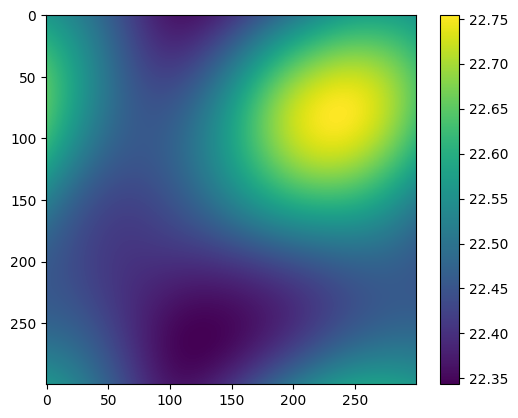

In [25]:
key = random.PRNGKey(123)
key, subkey = jax.random.split(key)
xi = jft.random_like(subkey, gp_map.domain)
res = gp_map(xi)

plt.imshow(res)
plt.colorbar()

In [26]:
todlist_prior = []

for i in range(5):
    key, subkey = jax.random.split(key)
    xi = jft.random_like(subkey, gp_map.domain)
    tod1 = signal_response_tod(xi)
    todlist_prior.append(tod1)
    
    
mean, std = jft.mean_and_std(tuple(todlist_prior))

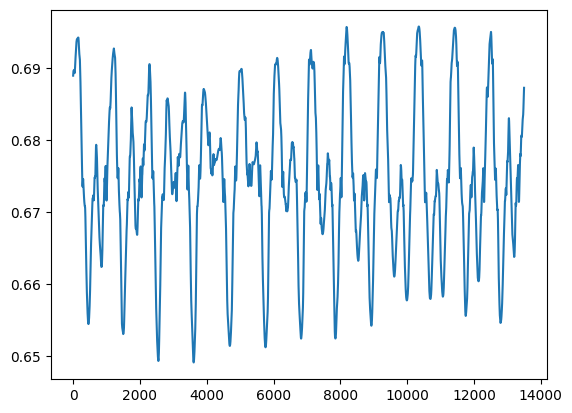

In [27]:
plt.plot(std[0])

# MAP fit

In [28]:
n_it = 1
# delta = 1e-4 # default
# delta = 1e-8 # map
# tod
if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4

n_samples = 0 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60 # map
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20 # map
        )
    ),
    sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
)

OPTIMIZE_KL: Starting 0001
M: →:1.0 ↺:False #∇²:06 |↘|:9.815004e+00 ➽:9.000300e+00
M: Iteration 1 ⛰:+6.031492e+19 Δ⛰:1.394578e+21
M: →:1.0 ↺:False #∇²:12 |↘|:1.163832e+00 ➽:9.000300e+00
M: Iteration 2 ⛰:+2.890329e+18 Δ⛰:5.742459e+19
OPTIMIZE_KL: Iteration 0001 ⛰:+2.8903e+18
OPTIMIZE_KL: #(KL minimization steps) 2
OPTIMIZE_KL: Likelihood residual(s):
'reduced χ²: 4.3e+10±     0.0, avg: +1.5e+04±     0.0, #dof:135243000'

OPTIMIZE_KL: Prior residual(s):
cfmapax1fluctuations    :: 'reduced χ²:     1.4±     0.0, avg:     -1.2±     0.0, #dof:      1'
cfmapax1loglogavgslope  :: 'reduced χ²:     1.8±     0.0, avg:     -1.3±     0.0, #dof:      1'
cfmapxi                 :: 'reduced χ²:     1.0±     0.0, avg: -0.00044±     0.0, #dof:  90000'
cfmapzeromode           :: 'reduced χ²:   0.093±     0.0, avg:     -0.3±     0.0, #dof:      1'




In [29]:
def printfitresults():
    print("Fit Results (res, init, std)")
    print(f"fluctuations: {jft.LogNormalPrior(*cf_fl_map['fluctuations'])(samples.pos['cfmapax1fluctuations'])}, {cf_fl_map['fluctuations'][0]}, {cf_fl_map['fluctuations'][1]}")
    print(f"loglogvarslope: {jft.NormalPrior(*cf_fl_map['loglogavgslope'])(samples.pos['cfmapax1loglogavgslope'])}, {cf_fl_map['loglogavgslope'][0]}, {cf_fl_map['loglogavgslope'][1]}")
    print(f"zeromode: {jft.LogNormalPrior(cf_zm_map['offset_mean'], cf_zm_map['offset_std'][0])(samples.pos['cfmapzeromode'])}, {cf_zm_map['offset_mean']}, {cf_zm_map['offset_std'][0]}")
    
printfitresults()

Fit Results (res, init, std)
fluctuations: 0.13086215004928076, 0.16871608827074525, 0.033743217654149046
loglogvarslope: -16.706609156433363, -10.0, 5.0
zeromode: 20.73203355308415, 20.95525829052564, 0.698508609684188


(200, 200)


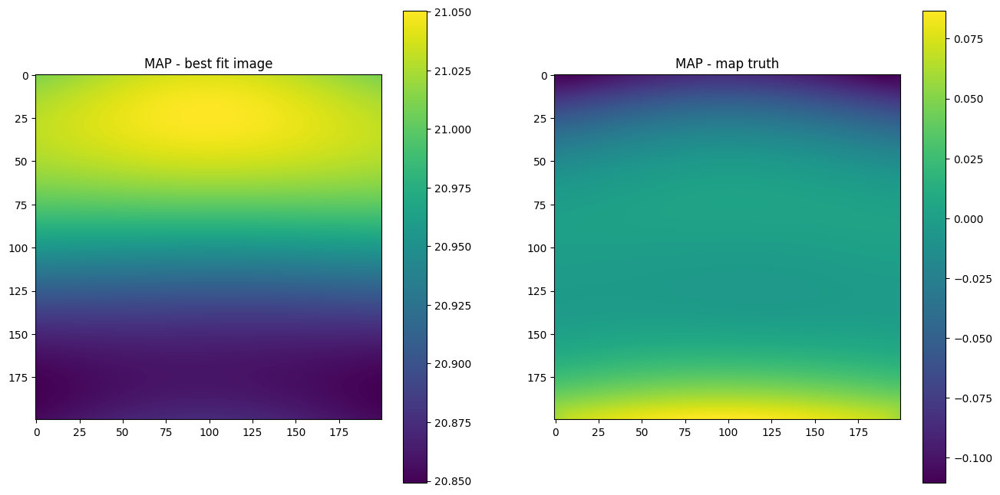

In [30]:
# plot maximum of posterior (mode)
# sig_map = signal_response(samples.pos) # gives time-series
sig_map = gp_map(samples.pos)[padding//2:-padding//2, padding//2:-padding//2] # when splitting up in different field models
print(sig_map.shape)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(sig_map)
axes[0].title.set_text('MAP - best fit image')
fig.colorbar(im0)

# im1 = axes[1].imshow( sig_map - mapdata_truth[0] )
im1 = axes[1].imshow( sig_map - atmosdata_truth )
axes[1].title.set_text('MAP - map truth')
# im1 = axes[1].imshow( (sig_map - mapdata_truth) )
# axes[1].title.set_text('diff prediction - map truth')
fig.colorbar(im1)

plt.show()

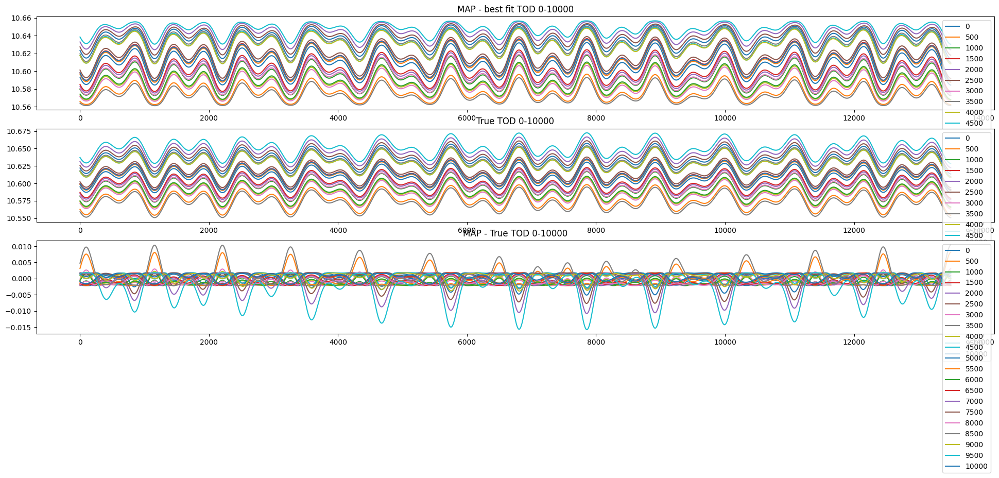

In [31]:
# plot maximum of posterior (mode)
pred_tods = signal_response_tod(samples.pos) # gives time-series

fig, axes = plt.subplots(3, 1, figsize=(8*3, 8))

# for i in [0, 10, 100, 200]:
for i in range(0, len(jax_tods), len(jax_tods)//20):
    im0 = axes[0].plot(pred_tods[i], label=i)
    # im1 = axes[1].plot(tods_map[i], label=i)
    im1 = axes[1].plot(jax_tods[i], label=i)
    im2 = axes[2].plot(pred_tods[i] - jax_tods[i], label=i)
    
axes[0].title.set_text(f'MAP - best fit TOD 0-{i}')
axes[0].legend()
axes[1].title.set_text(f'True TOD 0-{i}')
axes[1].legend()
axes[2].title.set_text(f'MAP - True TOD 0-{i}')
axes[2].legend()

plt.show()

In [32]:
# assert False

## Full nifty fit:

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+6.4409e+22 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+6.6487e+20 Δ⛰:6.3744e+22 ➽:9.0003e-07
SL: Iteration 2 ⛰:+2.4606e+20 Δ⛰:4.1880e+20 ➽:9.0003e-07
SL: Iteration 3 ⛰:+8.6153e+19 Δ⛰:1.5991e+20 ➽:9.0003e-07
SL: Iteration 4 ⛰:+4.1461e+19 Δ⛰:4.4692e+19 ➽:9.0003e-07
SL: Iteration 5 ⛰:+2.0107e+19 Δ⛰:2.1354e+19 ➽:9.0003e-07
SL: Iteration 6 ⛰:+1.9932e+19 Δ⛰:1.7476e+17 ➽:9.0003e-07
SL: Iteration 7 ⛰:+7.6323e+18 Δ⛰:1.2300e+19 ➽:9.0003e-07
SL: Iteration 8 ⛰:+6.6902e+18 Δ⛰:9.4211e+17 ➽:9.0003e-07
SL: Iteration 9 ⛰:+3.1280e+18 Δ⛰:3.5622e+18 ➽:9.0003e-07
SL: Iteration 10 ⛰:+1.6043e+18 Δ⛰:1.5236e+18 ➽:9.0003e-07
SL: Iteration 11 ⛰:+1.5259e+18 Δ⛰:7.8433e+16 ➽:9.0003e-07
SL: Iteration 12 ⛰:+7.6505e+17 Δ⛰:7.6084e+17 ➽:9.0003e-07
SL: Iteration 13 ⛰:+5.7033e+17 Δ⛰:1.9472e+17 ➽:9.0003e-07
SL: Iteration 14 ⛰:+5.6764e+17 Δ⛰:2.6838e+15 ➽:9.0003e-07
SL: Iteration 15 ⛰:+5.6759e+17 Δ⛰:4.8093e+13 ➽:9.0003e-07
SL: Iteration 16 ⛰:+4.6863e+17 Δ⛰:9.8964e+16 ➽:9.0003e-07
SL: 

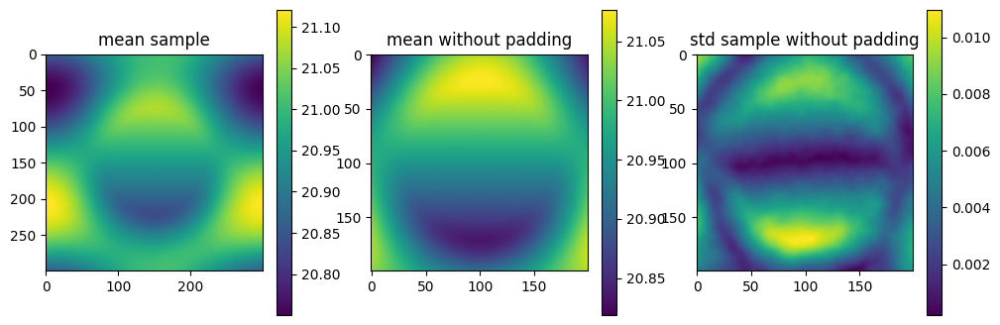

OPTIMIZE_KL: Starting 0002
SL: Iteration 0 ⛰:+4.9091e+18 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+2.7340e+18 Δ⛰:2.1751e+18 ➽:9.0003e-07
SL: Iteration 2 ⛰:+8.3754e+17 Δ⛰:1.8964e+18 ➽:9.0003e-07
SL: Iteration 3 ⛰:+4.7195e+17 Δ⛰:3.6559e+17 ➽:9.0003e-07
SL: Iteration 4 ⛰:+3.1912e+17 Δ⛰:1.5283e+17 ➽:9.0003e-07
SL: Iteration 5 ⛰:+1.4577e+17 Δ⛰:1.7335e+17 ➽:9.0003e-07
SL: Iteration 6 ⛰:+9.8507e+16 Δ⛰:4.7266e+16 ➽:9.0003e-07
SL: Iteration 7 ⛰:+8.0405e+16 Δ⛰:1.8102e+16 ➽:9.0003e-07
SL: Iteration 8 ⛰:+6.3825e+16 Δ⛰:1.6580e+16 ➽:9.0003e-07
SL: Iteration 9 ⛰:+5.6296e+16 Δ⛰:7.5288e+15 ➽:9.0003e-07
SL: Iteration 10 ⛰:+3.5345e+16 Δ⛰:2.0951e+16 ➽:9.0003e-07
SL: Iteration 11 ⛰:+3.4673e+16 Δ⛰:6.7206e+14 ➽:9.0003e-07
SL: Iteration 12 ⛰:+2.8812e+16 Δ⛰:5.8615e+15 ➽:9.0003e-07
SL: Iteration 13 ⛰:+2.8808e+16 Δ⛰:3.7279e+12 ➽:9.0003e-07
SL: Iteration 14 ⛰:+1.9970e+16 Δ⛰:8.8385e+15 ➽:9.0003e-07
SL: Iteration 15 ⛰:+1.9938e+16 Δ⛰:3.1498e+13 ➽:9.0003e-07
SL: Iteration 16 ⛰:+1.4881e+16 Δ⛰:5.0569e+15 ➽:9.0003e-07
SL: 

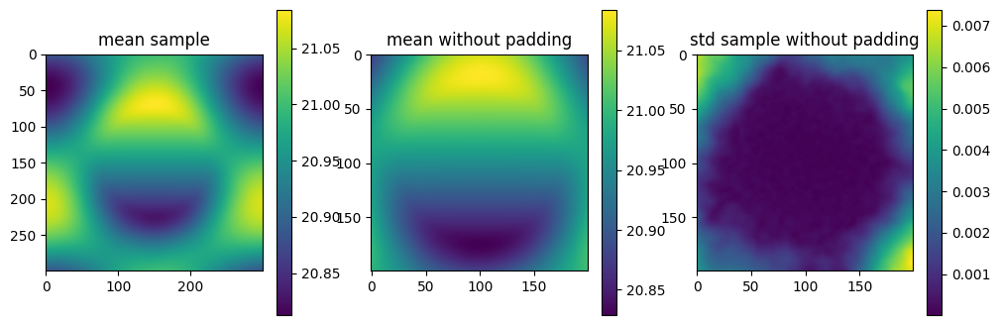

OPTIMIZE_KL: Starting 0003
SL: Iteration 0 ⛰:+1.3968e+19 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+5.4638e+18 Δ⛰:8.5039e+18 ➽:9.0003e-07
SL: Iteration 2 ⛰:+1.5306e+18 Δ⛰:3.9332e+18 ➽:9.0003e-07
SL: Iteration 3 ⛰:+5.6084e+17 Δ⛰:9.6972e+17 ➽:9.0003e-07
SL: Iteration 4 ⛰:+1.2485e+17 Δ⛰:4.3599e+17 ➽:9.0003e-07
SL: Iteration 5 ⛰:+4.2485e+16 Δ⛰:8.2366e+16 ➽:9.0003e-07
SL: Iteration 6 ⛰:+3.5808e+16 Δ⛰:6.6772e+15 ➽:9.0003e-07
SL: Iteration 7 ⛰:+3.1146e+16 Δ⛰:4.6627e+15 ➽:9.0003e-07
SL: Iteration 8 ⛰:+2.8817e+16 Δ⛰:2.3284e+15 ➽:9.0003e-07
SL: Iteration 9 ⛰:+1.8903e+16 Δ⛰:9.9138e+15 ➽:9.0003e-07
SL: Iteration 10 ⛰:+1.4630e+16 Δ⛰:4.2730e+15 ➽:9.0003e-07
SL: Iteration 11 ⛰:+1.4592e+16 Δ⛰:3.8495e+13 ➽:9.0003e-07
SL: Iteration 12 ⛰:+9.4944e+15 Δ⛰:5.0974e+15 ➽:9.0003e-07
SL: Iteration 13 ⛰:+9.4816e+15 Δ⛰:1.2806e+13 ➽:9.0003e-07
SL: Iteration 14 ⛰:+8.1797e+15 Δ⛰:1.3019e+15 ➽:9.0003e-07
SL: Iteration 15 ⛰:+8.1774e+15 Δ⛰:2.2866e+12 ➽:9.0003e-07
SL: Iteration 16 ⛰:+6.7337e+15 Δ⛰:1.4436e+15 ➽:9.0003e-07
SL: 

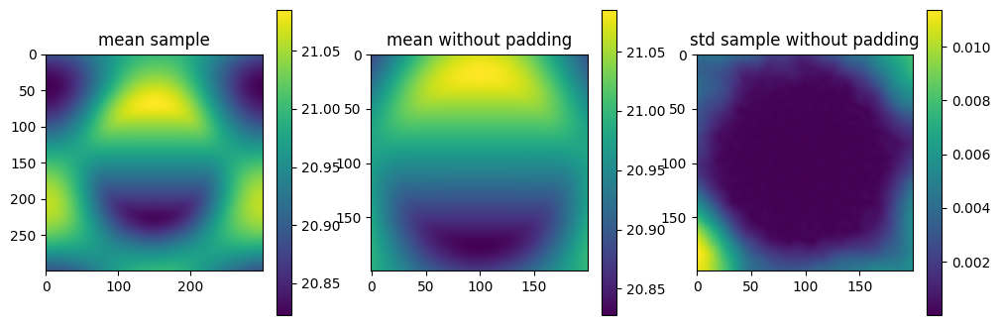

OPTIMIZE_KL: Starting 0004
SL: Iteration 0 ⛰:+3.0265e+19 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+7.4885e+18 Δ⛰:2.2777e+19 ➽:9.0003e-07
SL: Iteration 2 ⛰:+1.8268e+18 Δ⛰:5.6617e+18 ➽:9.0003e-07
SL: Iteration 3 ⛰:+4.4278e+17 Δ⛰:1.3840e+18 ➽:9.0003e-07
SL: Iteration 4 ⛰:+2.4032e+17 Δ⛰:2.0246e+17 ➽:9.0003e-07
SL: Iteration 5 ⛰:+1.3436e+17 Δ⛰:1.0596e+17 ➽:9.0003e-07
SL: Iteration 6 ⛰:+8.4137e+16 Δ⛰:5.0221e+16 ➽:9.0003e-07
SL: Iteration 7 ⛰:+4.3363e+16 Δ⛰:4.0773e+16 ➽:9.0003e-07
SL: Iteration 8 ⛰:+3.4459e+16 Δ⛰:8.9045e+15 ➽:9.0003e-07
SL: Iteration 9 ⛰:+3.4052e+16 Δ⛰:4.0678e+14 ➽:9.0003e-07
SL: Iteration 10 ⛰:+2.8325e+16 Δ⛰:5.7271e+15 ➽:9.0003e-07
SL: Iteration 11 ⛰:+1.4409e+16 Δ⛰:1.3915e+16 ➽:9.0003e-07
SL: Iteration 12 ⛰:+1.0746e+16 Δ⛰:3.6636e+15 ➽:9.0003e-07
SL: Iteration 13 ⛰:+1.0732e+16 Δ⛰:1.3830e+13 ➽:9.0003e-07
SL: Iteration 14 ⛰:+9.0502e+15 Δ⛰:1.6819e+15 ➽:9.0003e-07
SL: Iteration 15 ⛰:+8.9839e+15 Δ⛰:6.6312e+13 ➽:9.0003e-07
SL: Iteration 16 ⛰:+6.5014e+15 Δ⛰:2.4825e+15 ➽:9.0003e-07
SL: 

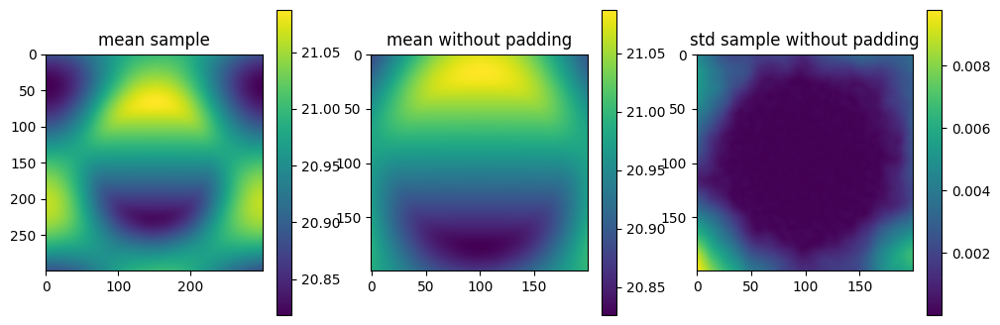

OPTIMIZE_KL: Starting 0005
SL: Iteration 0 ⛰:+3.0463e+20 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+1.5158e+19 Δ⛰:2.8947e+20 ➽:9.0003e-07
SL: Iteration 2 ⛰:+2.1961e+18 Δ⛰:1.2962e+19 ➽:9.0003e-07
SL: Iteration 3 ⛰:+5.9705e+17 Δ⛰:1.5991e+18 ➽:9.0003e-07
SL: Iteration 4 ⛰:+2.8356e+17 Δ⛰:3.1349e+17 ➽:9.0003e-07
SL: Iteration 5 ⛰:+1.1325e+17 Δ⛰:1.7030e+17 ➽:9.0003e-07
SL: Iteration 6 ⛰:+7.9481e+16 Δ⛰:3.3772e+16 ➽:9.0003e-07
SL: Iteration 7 ⛰:+5.0564e+16 Δ⛰:2.8918e+16 ➽:9.0003e-07
SL: Iteration 8 ⛰:+4.9869e+16 Δ⛰:6.9489e+14 ➽:9.0003e-07
SL: Iteration 9 ⛰:+3.0522e+16 Δ⛰:1.9346e+16 ➽:9.0003e-07
SL: Iteration 10 ⛰:+2.7420e+16 Δ⛰:3.1026e+15 ➽:9.0003e-07
SL: Iteration 11 ⛰:+1.5244e+16 Δ⛰:1.2176e+16 ➽:9.0003e-07
SL: Iteration 12 ⛰:+1.2235e+16 Δ⛰:3.0091e+15 ➽:9.0003e-07
SL: Iteration 13 ⛰:+1.2212e+16 Δ⛰:2.3077e+13 ➽:9.0003e-07
SL: Iteration 14 ⛰:+7.8416e+15 Δ⛰:4.3700e+15 ➽:9.0003e-07
SL: Iteration 15 ⛰:+7.8403e+15 Δ⛰:1.2757e+12 ➽:9.0003e-07
SL: Iteration 16 ⛰:+6.2538e+15 Δ⛰:1.5866e+15 ➽:9.0003e-07
SL: 

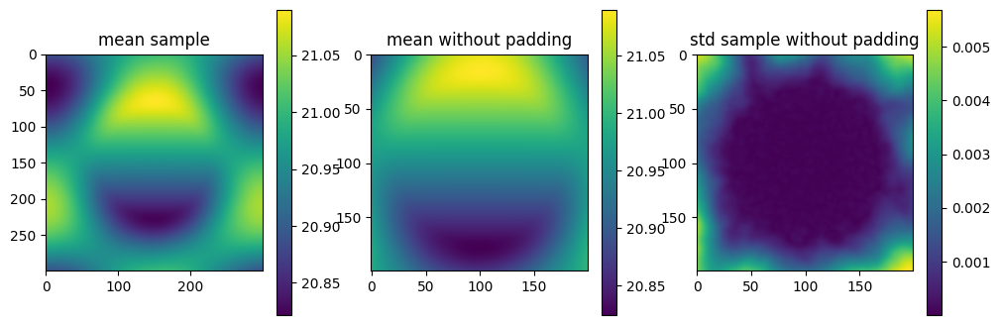

OPTIMIZE_KL: Starting 0006
SL: Iteration 0 ⛰:+1.1371e+19 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+7.3194e+18 Δ⛰:4.0517e+18 ➽:9.0003e-07
SL: Iteration 2 ⛰:+1.3495e+18 Δ⛰:5.9699e+18 ➽:9.0003e-07
SL: Iteration 3 ⛰:+1.0602e+18 Δ⛰:2.8929e+17 ➽:9.0003e-07
SL: Iteration 4 ⛰:+5.3644e+17 Δ⛰:5.2377e+17 ➽:9.0003e-07
SL: Iteration 5 ⛰:+7.5681e+16 Δ⛰:4.6075e+17 ➽:9.0003e-07
SL: Iteration 6 ⛰:+5.6116e+16 Δ⛰:1.9565e+16 ➽:9.0003e-07
SL: Iteration 7 ⛰:+2.2675e+16 Δ⛰:3.3442e+16 ➽:9.0003e-07
SL: Iteration 8 ⛰:+1.8398e+16 Δ⛰:4.2770e+15 ➽:9.0003e-07
SL: Iteration 9 ⛰:+1.7687e+16 Δ⛰:7.1078e+14 ➽:9.0003e-07
SL: Iteration 10 ⛰:+1.0865e+16 Δ⛰:6.8217e+15 ➽:9.0003e-07
SL: Iteration 11 ⛰:+1.0660e+16 Δ⛰:2.0463e+14 ➽:9.0003e-07
SL: Iteration 12 ⛰:+8.9821e+15 Δ⛰:1.6784e+15 ➽:9.0003e-07
SL: Iteration 13 ⛰:+8.9300e+15 Δ⛰:5.2067e+13 ➽:9.0003e-07
SL: Iteration 14 ⛰:+6.8583e+15 Δ⛰:2.0717e+15 ➽:9.0003e-07
SL: Iteration 15 ⛰:+6.5876e+15 Δ⛰:2.7073e+14 ➽:9.0003e-07
SL: Iteration 16 ⛰:+4.9468e+15 Δ⛰:1.6408e+15 ➽:9.0003e-07
SL: 

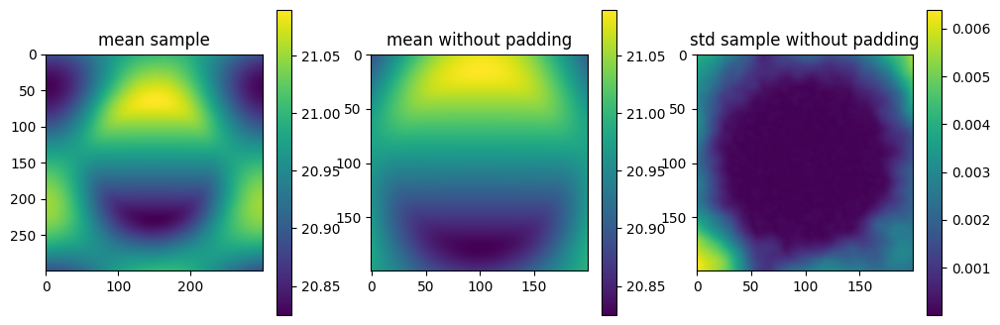

OPTIMIZE_KL: Starting 0007
SL: Iteration 0 ⛰:+1.2542e+20 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+1.9241e+19 Δ⛰:1.0617e+20 ➽:9.0003e-07
SL: Iteration 2 ⛰:+2.7949e+18 Δ⛰:1.6446e+19 ➽:9.0003e-07
SL: Iteration 3 ⛰:+5.4071e+17 Δ⛰:2.2542e+18 ➽:9.0003e-07
SL: Iteration 4 ⛰:+2.3899e+17 Δ⛰:3.0172e+17 ➽:9.0003e-07
SL: Iteration 5 ⛰:+1.0706e+17 Δ⛰:1.3193e+17 ➽:9.0003e-07
SL: Iteration 6 ⛰:+6.3971e+16 Δ⛰:4.3090e+16 ➽:9.0003e-07
SL: Iteration 7 ⛰:+2.8538e+16 Δ⛰:3.5433e+16 ➽:9.0003e-07
SL: Iteration 8 ⛰:+2.3590e+16 Δ⛰:4.9488e+15 ➽:9.0003e-07
SL: Iteration 9 ⛰:+1.9964e+16 Δ⛰:3.6260e+15 ➽:9.0003e-07
SL: Iteration 10 ⛰:+1.8959e+16 Δ⛰:1.0050e+15 ➽:9.0003e-07
SL: Iteration 11 ⛰:+9.9048e+15 Δ⛰:9.0540e+15 ➽:9.0003e-07
SL: Iteration 12 ⛰:+6.9995e+15 Δ⛰:2.9053e+15 ➽:9.0003e-07
SL: Iteration 13 ⛰:+6.6876e+15 Δ⛰:3.1192e+14 ➽:9.0003e-07
SL: Iteration 14 ⛰:+5.4937e+15 Δ⛰:1.1939e+15 ➽:9.0003e-07
SL: Iteration 15 ⛰:+5.4929e+15 Δ⛰:8.2530e+11 ➽:9.0003e-07
SL: Iteration 16 ⛰:+4.6828e+15 Δ⛰:8.1003e+14 ➽:9.0003e-07
SL: 

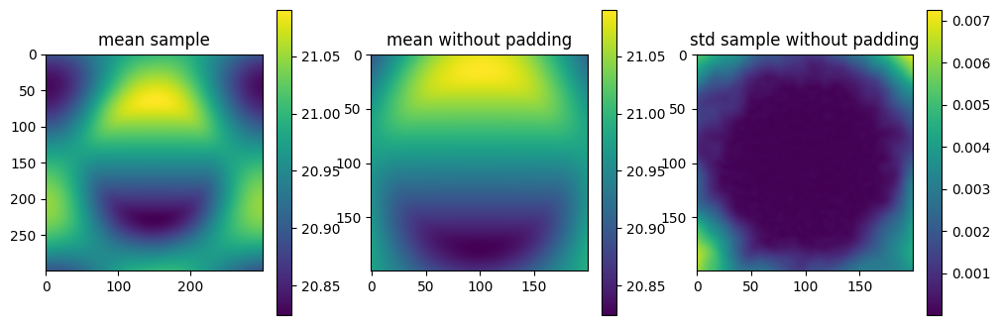

OPTIMIZE_KL: Starting 0008
SL: Iteration 0 ⛰:+8.0318e+19 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+1.5759e+19 Δ⛰:6.4559e+19 ➽:9.0003e-07
SL: Iteration 2 ⛰:+5.0972e+18 Δ⛰:1.0662e+19 ➽:9.0003e-07
SL: Iteration 3 ⛰:+4.3162e+17 Δ⛰:4.6656e+18 ➽:9.0003e-07
SL: Iteration 4 ⛰:+2.7458e+17 Δ⛰:1.5705e+17 ➽:9.0003e-07
SL: Iteration 5 ⛰:+1.2308e+17 Δ⛰:1.5150e+17 ➽:9.0003e-07
SL: Iteration 6 ⛰:+7.3596e+16 Δ⛰:4.9486e+16 ➽:9.0003e-07
SL: Iteration 7 ⛰:+3.2576e+16 Δ⛰:4.1019e+16 ➽:9.0003e-07
SL: Iteration 8 ⛰:+3.0134e+16 Δ⛰:2.4424e+15 ➽:9.0003e-07
SL: Iteration 9 ⛰:+2.5822e+16 Δ⛰:4.3117e+15 ➽:9.0003e-07
SL: Iteration 10 ⛰:+2.5656e+16 Δ⛰:1.6594e+14 ➽:9.0003e-07
SL: Iteration 11 ⛰:+1.3661e+16 Δ⛰:1.1995e+16 ➽:9.0003e-07
SL: Iteration 12 ⛰:+1.1076e+16 Δ⛰:2.5854e+15 ➽:9.0003e-07
SL: Iteration 13 ⛰:+1.1027e+16 Δ⛰:4.8775e+13 ➽:9.0003e-07
SL: Iteration 14 ⛰:+6.3052e+15 Δ⛰:4.7220e+15 ➽:9.0003e-07
SL: Iteration 15 ⛰:+6.3047e+15 Δ⛰:5.4969e+11 ➽:9.0003e-07
SL: Iteration 16 ⛰:+5.6038e+15 Δ⛰:7.0088e+14 ➽:9.0003e-07
SL: 

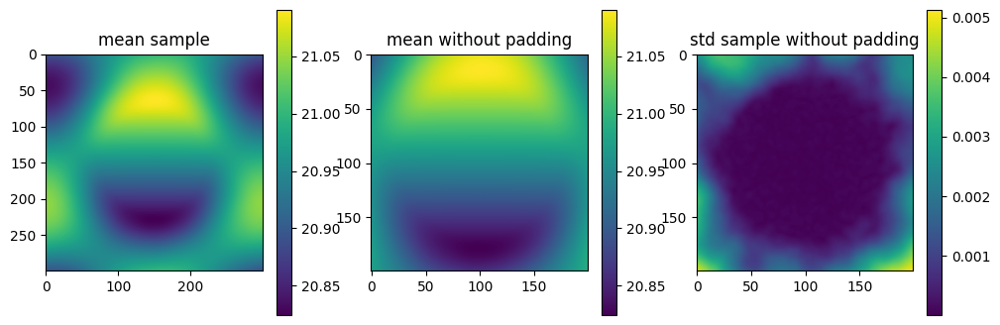

OPTIMIZE_KL: Starting 0009
SL: Iteration 0 ⛰:+4.5938e+19 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+9.3492e+18 Δ⛰:3.6589e+19 ➽:9.0003e-07
SL: Iteration 2 ⛰:+4.4161e+18 Δ⛰:4.9331e+18 ➽:9.0003e-07
SL: Iteration 3 ⛰:+1.3125e+18 Δ⛰:3.1037e+18 ➽:9.0003e-07
SL: Iteration 4 ⛰:+3.0275e+17 Δ⛰:1.0097e+18 ➽:9.0003e-07
SL: Iteration 5 ⛰:+1.2288e+17 Δ⛰:1.7987e+17 ➽:9.0003e-07
SL: Iteration 6 ⛰:+7.9895e+16 Δ⛰:4.2985e+16 ➽:9.0003e-07
SL: Iteration 7 ⛰:+3.7377e+16 Δ⛰:4.2518e+16 ➽:9.0003e-07
SL: Iteration 8 ⛰:+2.6432e+16 Δ⛰:1.0945e+16 ➽:9.0003e-07
SL: Iteration 9 ⛰:+2.0930e+16 Δ⛰:5.5018e+15 ➽:9.0003e-07
SL: Iteration 10 ⛰:+1.8980e+16 Δ⛰:1.9508e+15 ➽:9.0003e-07
SL: Iteration 11 ⛰:+1.3453e+16 Δ⛰:5.5266e+15 ➽:9.0003e-07
SL: Iteration 12 ⛰:+8.0818e+15 Δ⛰:5.3713e+15 ➽:9.0003e-07
SL: Iteration 13 ⛰:+8.0216e+15 Δ⛰:6.0225e+13 ➽:9.0003e-07
SL: Iteration 14 ⛰:+4.8745e+15 Δ⛰:3.1471e+15 ➽:9.0003e-07
SL: Iteration 15 ⛰:+4.8714e+15 Δ⛰:3.0552e+12 ➽:9.0003e-07
SL: Iteration 16 ⛰:+4.5870e+15 Δ⛰:2.8440e+14 ➽:9.0003e-07
SL: 

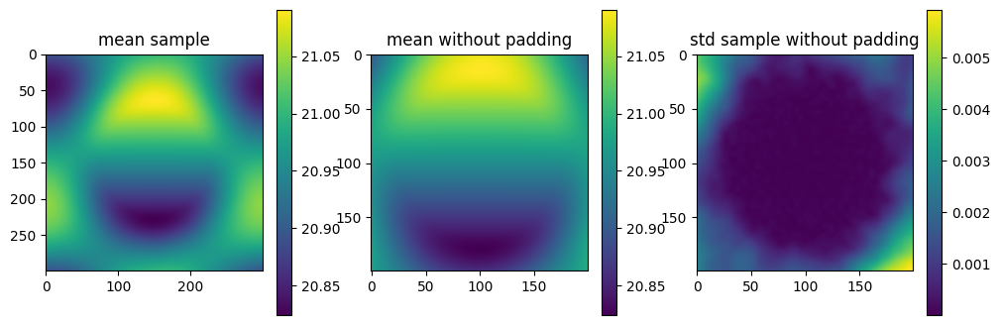

OPTIMIZE_KL: Starting 0010
SL: Iteration 0 ⛰:+4.0703e+19 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+4.0548e+18 Δ⛰:3.6649e+19 ➽:9.0003e-07
SL: Iteration 2 ⛰:+2.0645e+18 Δ⛰:1.9903e+18 ➽:9.0003e-07
SL: Iteration 3 ⛰:+1.0285e+18 Δ⛰:1.0360e+18 ➽:9.0003e-07
SL: Iteration 4 ⛰:+1.9219e+17 Δ⛰:8.3633e+17 ➽:9.0003e-07
SL: Iteration 5 ⛰:+8.9734e+16 Δ⛰:1.0246e+17 ➽:9.0003e-07
SL: Iteration 6 ⛰:+6.4632e+16 Δ⛰:2.5103e+16 ➽:9.0003e-07
SL: Iteration 7 ⛰:+2.8343e+16 Δ⛰:3.6289e+16 ➽:9.0003e-07
SL: Iteration 8 ⛰:+2.6862e+16 Δ⛰:1.4814e+15 ➽:9.0003e-07
SL: Iteration 9 ⛰:+2.1074e+16 Δ⛰:5.7881e+15 ➽:9.0003e-07
SL: Iteration 10 ⛰:+1.1049e+16 Δ⛰:1.0024e+16 ➽:9.0003e-07
SL: Iteration 11 ⛰:+9.3351e+15 Δ⛰:1.7139e+15 ➽:9.0003e-07
SL: Iteration 12 ⛰:+7.7419e+15 Δ⛰:1.5932e+15 ➽:9.0003e-07
SL: Iteration 13 ⛰:+7.6630e+15 Δ⛰:7.8962e+13 ➽:9.0003e-07
SL: Iteration 14 ⛰:+4.6023e+15 Δ⛰:3.0607e+15 ➽:9.0003e-07
SL: Iteration 15 ⛰:+4.5969e+15 Δ⛰:5.4233e+12 ➽:9.0003e-07
SL: Iteration 16 ⛰:+3.4215e+15 Δ⛰:1.1754e+15 ➽:9.0003e-07
SL: 

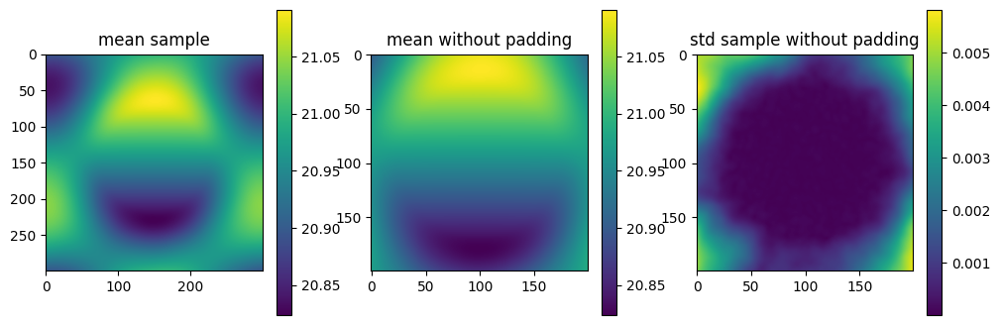

OPTIMIZE_KL: Starting 0011
SL: Iteration 0 ⛰:+7.3360e+19 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+1.3251e+19 Δ⛰:6.0109e+19 ➽:9.0003e-07
SL: Iteration 2 ⛰:+9.4123e+17 Δ⛰:1.2310e+19 ➽:9.0003e-07
SL: Iteration 3 ⛰:+3.9189e+17 Δ⛰:5.4934e+17 ➽:9.0003e-07
SL: Iteration 4 ⛰:+1.3149e+17 Δ⛰:2.6040e+17 ➽:9.0003e-07
SL: Iteration 5 ⛰:+7.7251e+16 Δ⛰:5.4238e+16 ➽:9.0003e-07
SL: Iteration 6 ⛰:+5.5259e+16 Δ⛰:2.1992e+16 ➽:9.0003e-07
SL: Iteration 7 ⛰:+3.0379e+16 Δ⛰:2.4880e+16 ➽:9.0003e-07
SL: Iteration 8 ⛰:+2.5116e+16 Δ⛰:5.2633e+15 ➽:9.0003e-07
SL: Iteration 9 ⛰:+2.5090e+16 Δ⛰:2.6110e+13 ➽:9.0003e-07
SL: Iteration 10 ⛰:+1.8989e+16 Δ⛰:6.1005e+15 ➽:9.0003e-07
SL: Iteration 11 ⛰:+1.3146e+16 Δ⛰:5.8437e+15 ➽:9.0003e-07
SL: Iteration 12 ⛰:+1.0628e+16 Δ⛰:2.5175e+15 ➽:9.0003e-07
SL: Iteration 13 ⛰:+1.0612e+16 Δ⛰:1.6467e+13 ➽:9.0003e-07
SL: Iteration 14 ⛰:+6.3012e+15 Δ⛰:4.3105e+15 ➽:9.0003e-07
SL: Iteration 15 ⛰:+6.1811e+15 Δ⛰:1.2009e+14 ➽:9.0003e-07
SL: Iteration 16 ⛰:+5.7989e+15 Δ⛰:3.8227e+14 ➽:9.0003e-07
SL: 

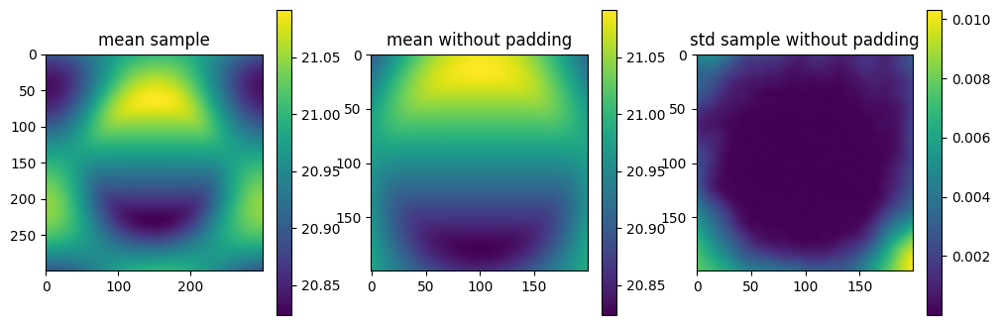

OPTIMIZE_KL: Starting 0012
SL: Iteration 0 ⛰:+1.0732e+20 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+4.5541e+18 Δ⛰:1.0276e+20 ➽:9.0003e-07
SL: Iteration 2 ⛰:+1.7823e+18 Δ⛰:2.7719e+18 ➽:9.0003e-07
SL: Iteration 3 ⛰:+5.8731e+17 Δ⛰:1.1950e+18 ➽:9.0003e-07
SL: Iteration 4 ⛰:+3.4943e+17 Δ⛰:2.3788e+17 ➽:9.0003e-07
SL: Iteration 5 ⛰:+9.1252e+16 Δ⛰:2.5818e+17 ➽:9.0003e-07
SL: Iteration 6 ⛰:+4.4641e+16 Δ⛰:4.6610e+16 ➽:9.0003e-07
SL: Iteration 7 ⛰:+2.1691e+16 Δ⛰:2.2951e+16 ➽:9.0003e-07
SL: Iteration 8 ⛰:+2.1677e+16 Δ⛰:1.3775e+13 ➽:9.0003e-07
SL: Iteration 9 ⛰:+1.3895e+16 Δ⛰:7.7818e+15 ➽:9.0003e-07
SL: Iteration 10 ⛰:+1.1097e+16 Δ⛰:2.7984e+15 ➽:9.0003e-07
SL: Iteration 11 ⛰:+7.6741e+15 Δ⛰:3.4227e+15 ➽:9.0003e-07
SL: Iteration 12 ⛰:+6.3424e+15 Δ⛰:1.3317e+15 ➽:9.0003e-07
SL: Iteration 13 ⛰:+6.3260e+15 Δ⛰:1.6367e+13 ➽:9.0003e-07
SL: Iteration 14 ⛰:+4.6108e+15 Δ⛰:1.7153e+15 ➽:9.0003e-07
SL: Iteration 15 ⛰:+4.6098e+15 Δ⛰:9.3941e+11 ➽:9.0003e-07
SL: Iteration 16 ⛰:+4.2244e+15 Δ⛰:3.8545e+14 ➽:9.0003e-07
SL: 

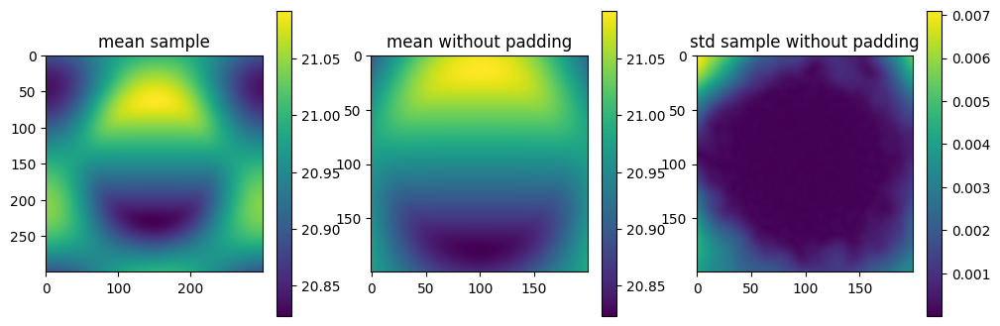

OPTIMIZE_KL: Starting 0013
SL: Iteration 0 ⛰:+3.2513e+19 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+6.3402e+18 Δ⛰:2.6173e+19 ➽:9.0003e-07
SL: Iteration 2 ⛰:+1.4786e+18 Δ⛰:4.8616e+18 ➽:9.0003e-07
SL: Iteration 3 ⛰:+8.5038e+17 Δ⛰:6.2826e+17 ➽:9.0003e-07
SL: Iteration 4 ⛰:+5.3614e+17 Δ⛰:3.1424e+17 ➽:9.0003e-07
SL: Iteration 5 ⛰:+7.2782e+16 Δ⛰:4.6336e+17 ➽:9.0003e-07
SL: Iteration 6 ⛰:+3.9334e+16 Δ⛰:3.3448e+16 ➽:9.0003e-07
SL: Iteration 7 ⛰:+2.3927e+16 Δ⛰:1.5407e+16 ➽:9.0003e-07
SL: Iteration 8 ⛰:+1.8925e+16 Δ⛰:5.0022e+15 ➽:9.0003e-07
SL: Iteration 9 ⛰:+1.7928e+16 Δ⛰:9.9759e+14 ➽:9.0003e-07
SL: Iteration 10 ⛰:+1.6865e+16 Δ⛰:1.0629e+15 ➽:9.0003e-07
SL: Iteration 11 ⛰:+7.1968e+15 Δ⛰:9.6679e+15 ➽:9.0003e-07
SL: Iteration 12 ⛰:+4.2504e+15 Δ⛰:2.9464e+15 ➽:9.0003e-07
SL: Iteration 13 ⛰:+4.2218e+15 Δ⛰:2.8646e+13 ➽:9.0003e-07
SL: Iteration 14 ⛰:+2.9837e+15 Δ⛰:1.2381e+15 ➽:9.0003e-07
SL: Iteration 15 ⛰:+2.9824e+15 Δ⛰:1.2760e+12 ➽:9.0003e-07
SL: Iteration 16 ⛰:+2.2621e+15 Δ⛰:7.2034e+14 ➽:9.0003e-07
SL: 

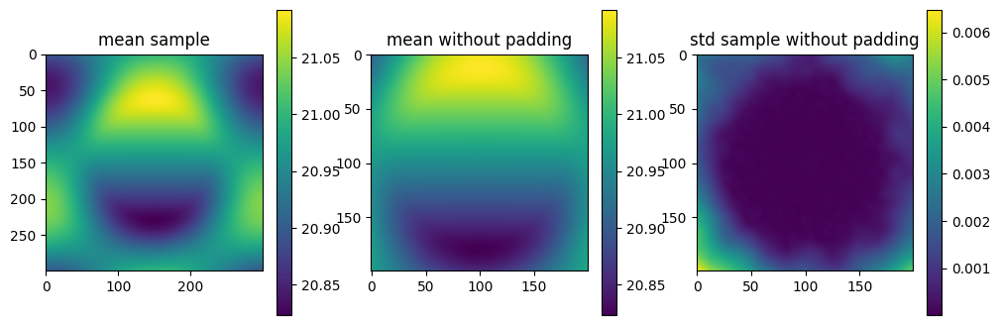

OPTIMIZE_KL: Starting 0014
SL: Iteration 0 ⛰:+2.1824e+20 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+3.9592e+19 Δ⛰:1.7865e+20 ➽:9.0003e-07
SL: Iteration 2 ⛰:+2.8516e+18 Δ⛰:3.6740e+19 ➽:9.0003e-07
SL: Iteration 3 ⛰:+9.9220e+17 Δ⛰:1.8594e+18 ➽:9.0003e-07
SL: Iteration 4 ⛰:+1.1490e+17 Δ⛰:8.7729e+17 ➽:9.0003e-07
SL: Iteration 5 ⛰:+4.1935e+16 Δ⛰:7.2968e+16 ➽:9.0003e-07
SL: Iteration 6 ⛰:+3.3758e+16 Δ⛰:8.1772e+15 ➽:9.0003e-07
SL: Iteration 7 ⛰:+2.2794e+16 Δ⛰:1.0964e+16 ➽:9.0003e-07
SL: Iteration 8 ⛰:+2.2038e+16 Δ⛰:7.5599e+14 ➽:9.0003e-07
SL: Iteration 9 ⛰:+1.6384e+16 Δ⛰:5.6538e+15 ➽:9.0003e-07
SL: Iteration 10 ⛰:+1.5745e+16 Δ⛰:6.3968e+14 ➽:9.0003e-07
SL: Iteration 11 ⛰:+6.1942e+15 Δ⛰:9.5504e+15 ➽:9.0003e-07
SL: Iteration 12 ⛰:+5.1458e+15 Δ⛰:1.0485e+15 ➽:9.0003e-07
SL: Iteration 13 ⛰:+5.1250e+15 Δ⛰:2.0802e+13 ➽:9.0003e-07
SL: Iteration 14 ⛰:+3.4154e+15 Δ⛰:1.7095e+15 ➽:9.0003e-07
SL: Iteration 15 ⛰:+3.4135e+15 Δ⛰:1.8992e+12 ➽:9.0003e-07
SL: Iteration 16 ⛰:+3.4030e+15 Δ⛰:1.0521e+13 ➽:9.0003e-07
SL: 

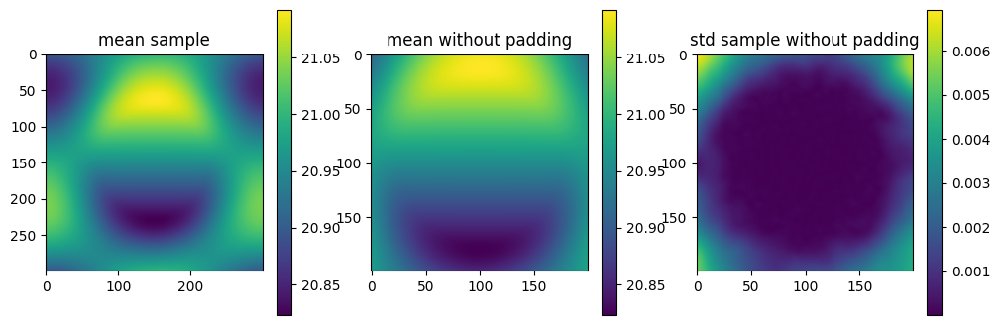

OPTIMIZE_KL: Starting 0015
SL: Iteration 0 ⛰:+2.1031e+19 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+5.7368e+18 Δ⛰:1.5294e+19 ➽:9.0003e-07
SL: Iteration 2 ⛰:+2.8489e+18 Δ⛰:2.8880e+18 ➽:9.0003e-07
SL: Iteration 3 ⛰:+1.5943e+18 Δ⛰:1.2546e+18 ➽:9.0003e-07
SL: Iteration 4 ⛰:+8.6907e+17 Δ⛰:7.2518e+17 ➽:9.0003e-07
SL: Iteration 5 ⛰:+1.9082e+17 Δ⛰:6.7825e+17 ➽:9.0003e-07
SL: Iteration 6 ⛰:+7.0404e+16 Δ⛰:1.2042e+17 ➽:9.0003e-07
SL: Iteration 7 ⛰:+5.0966e+16 Δ⛰:1.9438e+16 ➽:9.0003e-07
SL: Iteration 8 ⛰:+3.4223e+16 Δ⛰:1.6743e+16 ➽:9.0003e-07
SL: Iteration 9 ⛰:+2.6160e+16 Δ⛰:8.0631e+15 ➽:9.0003e-07
SL: Iteration 10 ⛰:+2.4546e+16 Δ⛰:1.6143e+15 ➽:9.0003e-07
SL: Iteration 11 ⛰:+6.3245e+15 Δ⛰:1.8221e+16 ➽:9.0003e-07
SL: Iteration 12 ⛰:+4.4654e+15 Δ⛰:1.8591e+15 ➽:9.0003e-07
SL: Iteration 13 ⛰:+4.4423e+15 Δ⛰:2.3193e+13 ➽:9.0003e-07
SL: Iteration 14 ⛰:+3.1096e+15 Δ⛰:1.3326e+15 ➽:9.0003e-07
SL: Iteration 15 ⛰:+3.1087e+15 Δ⛰:9.4426e+11 ➽:9.0003e-07
SL: Iteration 16 ⛰:+2.8827e+15 Δ⛰:2.2595e+14 ➽:9.0003e-07
SL: 

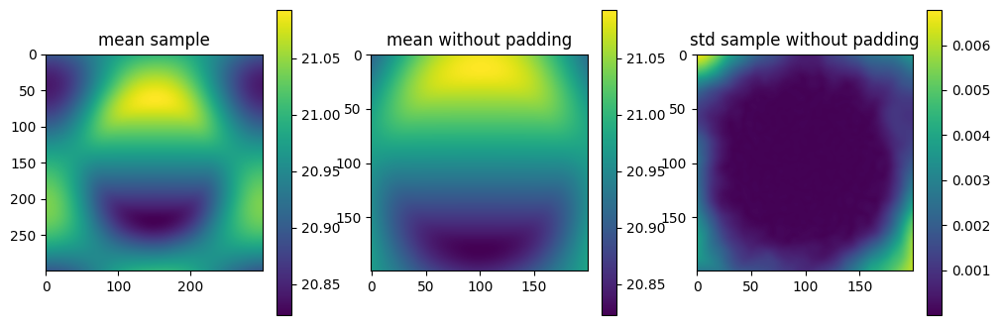

OPTIMIZE_KL: Starting 0016
SL: Iteration 0 ⛰:+6.0179e+19 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+1.1827e+19 Δ⛰:4.8352e+19 ➽:9.0003e-07
SL: Iteration 2 ⛰:+3.5519e+18 Δ⛰:8.2752e+18 ➽:9.0003e-07
SL: Iteration 3 ⛰:+4.1442e+17 Δ⛰:3.1374e+18 ➽:9.0003e-07
SL: Iteration 4 ⛰:+2.1077e+17 Δ⛰:2.0366e+17 ➽:9.0003e-07
SL: Iteration 5 ⛰:+6.5839e+16 Δ⛰:1.4493e+17 ➽:9.0003e-07
SL: Iteration 6 ⛰:+4.6560e+16 Δ⛰:1.9279e+16 ➽:9.0003e-07
SL: Iteration 7 ⛰:+2.4646e+16 Δ⛰:2.1914e+16 ➽:9.0003e-07
SL: Iteration 8 ⛰:+2.1870e+16 Δ⛰:2.7760e+15 ➽:9.0003e-07
SL: Iteration 9 ⛰:+1.4328e+16 Δ⛰:7.5426e+15 ➽:9.0003e-07
SL: Iteration 10 ⛰:+1.2092e+16 Δ⛰:2.2354e+15 ➽:9.0003e-07
SL: Iteration 11 ⛰:+6.6074e+15 Δ⛰:5.4849e+15 ➽:9.0003e-07
SL: Iteration 12 ⛰:+4.8614e+15 Δ⛰:1.7460e+15 ➽:9.0003e-07
SL: Iteration 13 ⛰:+4.8478e+15 Δ⛰:1.3623e+13 ➽:9.0003e-07
SL: Iteration 14 ⛰:+4.0017e+15 Δ⛰:8.4613e+14 ➽:9.0003e-07
SL: Iteration 15 ⛰:+3.5843e+15 Δ⛰:4.1739e+14 ➽:9.0003e-07
SL: Iteration 16 ⛰:+3.3182e+15 Δ⛰:2.6612e+14 ➽:9.0003e-07
SL: 

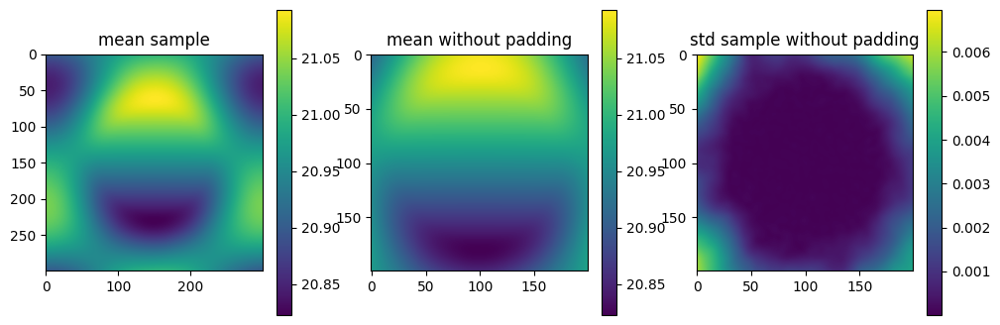

OPTIMIZE_KL: Starting 0017
SL: Iteration 0 ⛰:+4.5560e+19 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+1.1989e+19 Δ⛰:3.3571e+19 ➽:9.0003e-07
SL: Iteration 2 ⛰:+7.5441e+17 Δ⛰:1.1234e+19 ➽:9.0003e-07
SL: Iteration 3 ⛰:+4.5775e+17 Δ⛰:2.9666e+17 ➽:9.0003e-07
SL: Iteration 4 ⛰:+3.4034e+17 Δ⛰:1.1741e+17 ➽:9.0003e-07
SL: Iteration 5 ⛰:+6.8981e+16 Δ⛰:2.7136e+17 ➽:9.0003e-07
SL: Iteration 6 ⛰:+2.8455e+16 Δ⛰:4.0526e+16 ➽:9.0003e-07
SL: Iteration 7 ⛰:+1.9494e+16 Δ⛰:8.9612e+15 ➽:9.0003e-07
SL: Iteration 8 ⛰:+1.9093e+16 Δ⛰:4.0095e+14 ➽:9.0003e-07
SL: Iteration 9 ⛰:+1.2394e+16 Δ⛰:6.6984e+15 ➽:9.0003e-07
SL: Iteration 10 ⛰:+7.3196e+15 Δ⛰:5.0748e+15 ➽:9.0003e-07
SL: Iteration 11 ⛰:+7.2763e+15 Δ⛰:4.3281e+13 ➽:9.0003e-07
SL: Iteration 12 ⛰:+5.7868e+15 Δ⛰:1.4895e+15 ➽:9.0003e-07
SL: Iteration 13 ⛰:+5.7765e+15 Δ⛰:1.0332e+13 ➽:9.0003e-07
SL: Iteration 14 ⛰:+3.4195e+15 Δ⛰:2.3570e+15 ➽:9.0003e-07
SL: Iteration 15 ⛰:+3.1571e+15 Δ⛰:2.6244e+14 ➽:9.0003e-07
SL: Iteration 16 ⛰:+3.0431e+15 Δ⛰:1.1397e+14 ➽:9.0003e-07
SL: 

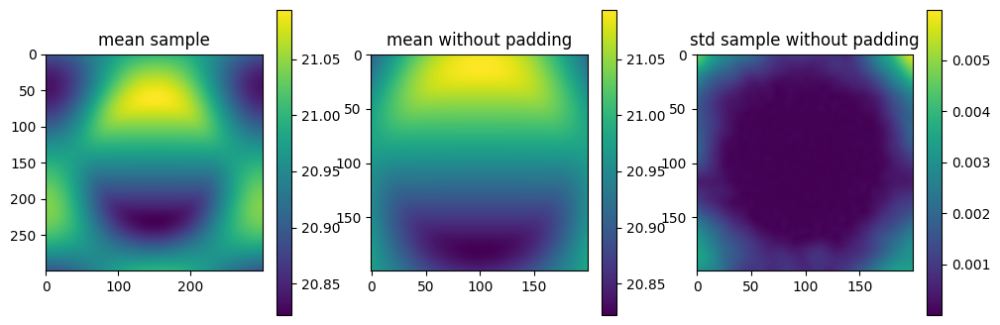

OPTIMIZE_KL: Starting 0018
SL: Iteration 0 ⛰:+3.9061e+19 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+1.5417e+19 Δ⛰:2.3644e+19 ➽:9.0003e-07
SL: Iteration 2 ⛰:+1.3379e+18 Δ⛰:1.4079e+19 ➽:9.0003e-07
SL: Iteration 3 ⛰:+1.8338e+17 Δ⛰:1.1546e+18 ➽:9.0003e-07
SL: Iteration 4 ⛰:+8.5744e+16 Δ⛰:9.7635e+16 ➽:9.0003e-07
SL: Iteration 5 ⛰:+6.1772e+16 Δ⛰:2.3972e+16 ➽:9.0003e-07
SL: Iteration 6 ⛰:+3.4977e+16 Δ⛰:2.6795e+16 ➽:9.0003e-07
SL: Iteration 7 ⛰:+2.3456e+16 Δ⛰:1.1521e+16 ➽:9.0003e-07
SL: Iteration 8 ⛰:+2.2255e+16 Δ⛰:1.2007e+15 ➽:9.0003e-07
SL: Iteration 9 ⛰:+1.4956e+16 Δ⛰:7.2992e+15 ➽:9.0003e-07
SL: Iteration 10 ⛰:+1.0724e+16 Δ⛰:4.2316e+15 ➽:9.0003e-07
SL: Iteration 11 ⛰:+9.4353e+15 Δ⛰:1.2891e+15 ➽:9.0003e-07
SL: Iteration 12 ⛰:+8.0233e+15 Δ⛰:1.4120e+15 ➽:9.0003e-07
SL: Iteration 13 ⛰:+7.0602e+15 Δ⛰:9.6312e+14 ➽:9.0003e-07
SL: Iteration 14 ⛰:+5.4293e+15 Δ⛰:1.6309e+15 ➽:9.0003e-07
SL: Iteration 15 ⛰:+4.9015e+15 Δ⛰:5.2776e+14 ➽:9.0003e-07
SL: Iteration 16 ⛰:+4.1540e+15 Δ⛰:7.4753e+14 ➽:9.0003e-07
SL: 

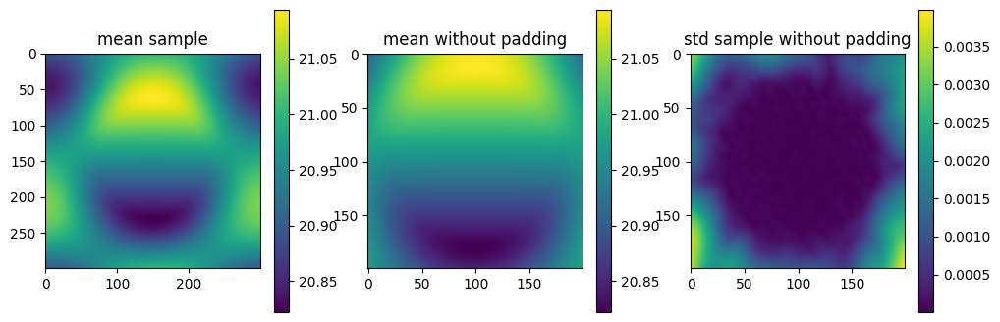

OPTIMIZE_KL: Starting 0019
SL: Iteration 0 ⛰:+3.1776e+19 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+1.5070e+19 Δ⛰:1.6707e+19 ➽:9.0003e-07
SL: Iteration 2 ⛰:+6.6382e+18 Δ⛰:8.4314e+18 ➽:9.0003e-07
SL: Iteration 3 ⛰:+1.7714e+18 Δ⛰:4.8668e+18 ➽:9.0003e-07
SL: Iteration 4 ⛰:+2.1167e+17 Δ⛰:1.5597e+18 ➽:9.0003e-07
SL: Iteration 5 ⛰:+5.3276e+16 Δ⛰:1.5839e+17 ➽:9.0003e-07
SL: Iteration 6 ⛰:+3.1837e+16 Δ⛰:2.1439e+16 ➽:9.0003e-07
SL: Iteration 7 ⛰:+2.5232e+16 Δ⛰:6.6051e+15 ➽:9.0003e-07
SL: Iteration 8 ⛰:+2.3805e+16 Δ⛰:1.4270e+15 ➽:9.0003e-07
SL: Iteration 9 ⛰:+1.7551e+16 Δ⛰:6.2537e+15 ➽:9.0003e-07
SL: Iteration 10 ⛰:+1.7321e+16 Δ⛰:2.3068e+14 ➽:9.0003e-07
SL: Iteration 11 ⛰:+8.1432e+15 Δ⛰:9.1775e+15 ➽:9.0003e-07
SL: Iteration 12 ⛰:+7.3577e+15 Δ⛰:7.8546e+14 ➽:9.0003e-07
SL: Iteration 13 ⛰:+5.6978e+15 Δ⛰:1.6599e+15 ➽:9.0003e-07
SL: Iteration 14 ⛰:+2.9018e+15 Δ⛰:2.7961e+15 ➽:9.0003e-07
SL: Iteration 15 ⛰:+2.8885e+15 Δ⛰:1.3271e+13 ➽:9.0003e-07
SL: Iteration 16 ⛰:+2.8783e+15 Δ⛰:1.0198e+13 ➽:9.0003e-07
SL: 

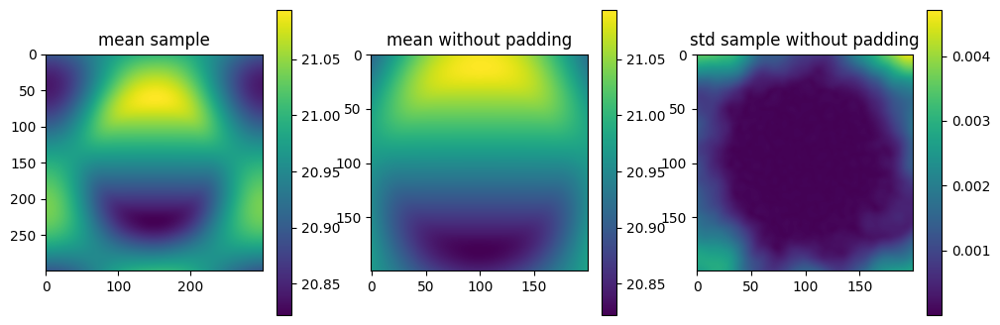

OPTIMIZE_KL: Starting 0020
SL: Iteration 0 ⛰:+9.5337e+19 Δ⛰:inf ➽:9.0003e-07
SL: Iteration 1 ⛰:+1.4420e+19 Δ⛰:8.0917e+19 ➽:9.0003e-07
SL: Iteration 2 ⛰:+5.5467e+17 Δ⛰:1.3866e+19 ➽:9.0003e-07
SL: Iteration 3 ⛰:+1.8955e+17 Δ⛰:3.6511e+17 ➽:9.0003e-07
SL: Iteration 4 ⛰:+1.1693e+17 Δ⛰:7.2628e+16 ➽:9.0003e-07
SL: Iteration 5 ⛰:+2.2370e+16 Δ⛰:9.4556e+16 ➽:9.0003e-07
SL: Iteration 6 ⛰:+1.9703e+16 Δ⛰:2.6674e+15 ➽:9.0003e-07
SL: Iteration 7 ⛰:+1.0939e+16 Δ⛰:8.7641e+15 ➽:9.0003e-07
SL: Iteration 8 ⛰:+1.0933e+16 Δ⛰:5.4359e+12 ➽:9.0003e-07
SL: Iteration 9 ⛰:+9.0076e+15 Δ⛰:1.9258e+15 ➽:9.0003e-07
SL: Iteration 10 ⛰:+8.5169e+15 Δ⛰:4.9068e+14 ➽:9.0003e-07
SL: Iteration 11 ⛰:+4.0255e+15 Δ⛰:4.4914e+15 ➽:9.0003e-07
SL: Iteration 12 ⛰:+3.1493e+15 Δ⛰:8.7618e+14 ➽:9.0003e-07
SL: Iteration 13 ⛰:+3.1157e+15 Δ⛰:3.3623e+13 ➽:9.0003e-07
SL: Iteration 14 ⛰:+2.6060e+15 Δ⛰:5.0975e+14 ➽:9.0003e-07
SL: Iteration 15 ⛰:+2.4344e+15 Δ⛰:1.7158e+14 ➽:9.0003e-07
SL: Iteration 16 ⛰:+2.2307e+15 Δ⛰:2.0371e+14 ➽:9.0003e-07
SL: 

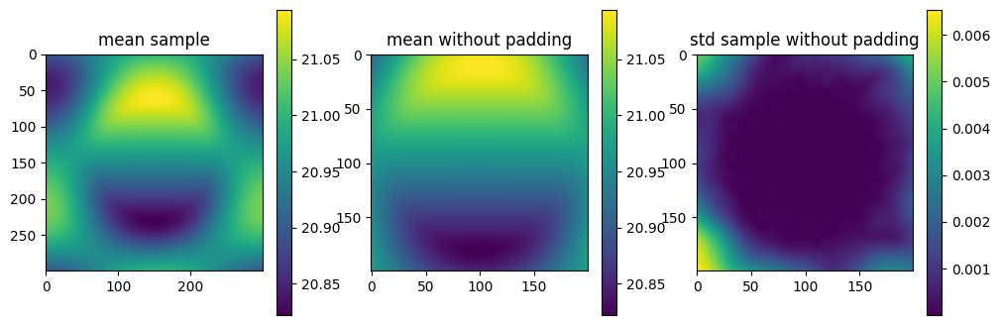

In [33]:
# n_it = 1
n_it = 20
# delta = 1e-4 # default
# delta = 1e-8 # map
# tod
if noiselevel == 0.0: delta = 1e-10
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4
n_samples = 4 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

# callback fn for plotting during optimisation:
def callback(samples, opt_state):
    mean, std = jft.mean_and_std(tuple(gp_map(s) for s in samples))
    
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    im0 = axes[0].imshow(mean)
    axes[0].title.set_text('mean sample')
    fig.colorbar(im0)
    
    im1 = axes[1].imshow(mean[padding//2:-padding//2, padding//2:-padding//2])
    axes[1].title.set_text('mean without padding')
    fig.colorbar(im1)

    im2 = axes[2].imshow(std[padding//2:-padding//2, padding//2:-padding//2])
    axes[2].title.set_text('std sample without padding')
    fig.colorbar(im2)
    
    plt.show()

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
        # cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=10),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=10
        )
    ),
    # sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
    sample_mode = lambda x: "nonlinear_resample" if x >= 1 else "linear_resample",
    callback=callback,
)

In [34]:
printfitresults()

Fit Results (res, init, std)
fluctuations: 0.006808782782261945, 0.16871608827074525, 0.033743217654149046
loglogvarslope: -5.78234638650202, -10.0, 5.0
zeromode: 15.251657404465472, 20.95525829052564, 0.698508609684188


In [ ]:
# plot time-series for det 0 for all samples:
fig, axes = plt.subplots(3, 1, figsize=(16, 8))

mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

i = 0
for s in samples:

    axes[0].plot(signal_response_tod(s)[0], label=f"pred {i}")
    # axes[1].plot((signal_response_tod(s)[0] - jax_tods[0])/std[0], label=i)
    i += 1

axes[0].plot(jax_tods[0], label="truth")
axes[0].set_title("Sample prediction TOD0")
axes[0].legend()

# axes[1].plot(jax_tods[0])
axes[1].plot((mean[0] - jax_tods[0])/std[0])
axes[1].set_title(f"Pull plot: (mean - pred.)/stdev det 0")

axes[2].plot(std[0])
axes[2].set_title(f"stdev det 0")

plt.show()

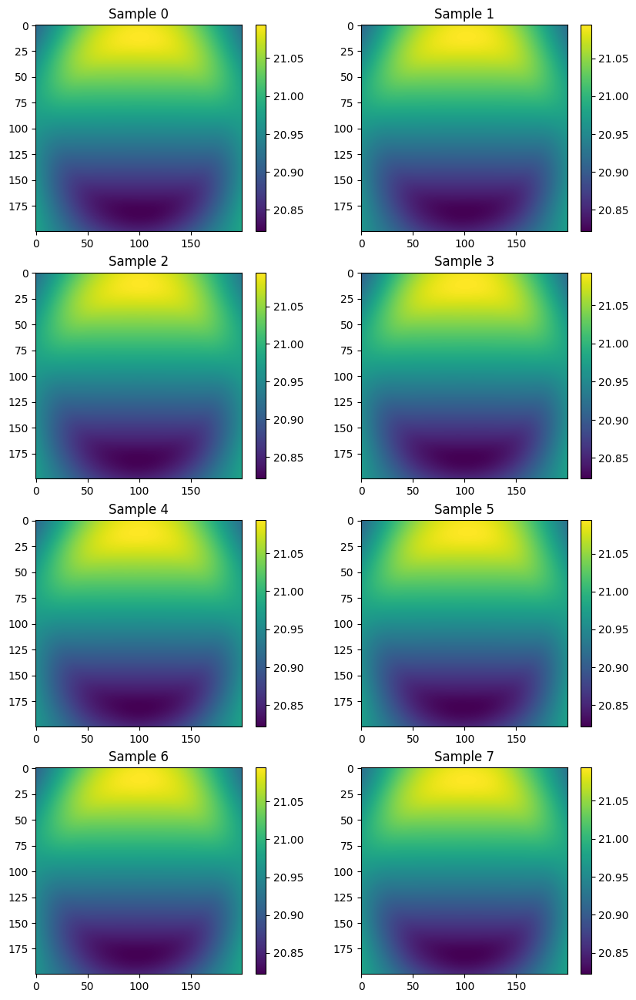

In [35]:
# plot all samples
fig, axes = plt.subplots(4, 2, figsize=(10, 16))

i = 0
for s in samples:
    # print(i//4, i%4)
    # im = axes[i//4][i%4].imshow(signal_response(s))``
    im = axes[i//2][i%2].imshow(gp_map(s)[padding//2:-padding//2, padding//2:-padding//2])
    axes[i//2][i%2].title.set_text(f"Sample {i}")
    fig.colorbar(im)
    
    i += 1

plt.show()

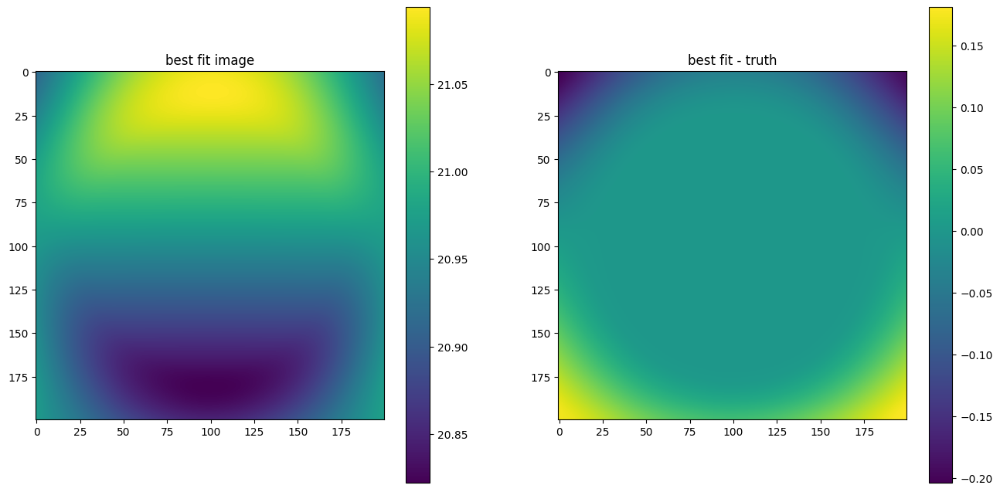

In [36]:
# plot maximum of posterior (mode)
# sig_map = signal_response(samples.pos) # gives time-series
sig_map = gp_map(samples.pos) # when splitting up in different field models

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(sig_map[padding//2:-padding//2, padding//2:-padding//2])
# im0 = axes[0].imshow(sig_map)
axes[0].title.set_text('best fit image')
fig.colorbar(im0)

im1 = axes[1].imshow( sig_map[padding//2:-padding//2, padding//2:-padding//2] - atmosdata_truth)
# im1 = axes[1].imshow( sig_map - atmosdata_truth)
axes[1].title.set_text('best fit - truth')
# im1 = axes[1].imshow( (sig_map - mapdata_truth) )
# axes[1].title.set_text('diff prediction - map truth')
fig.colorbar(im1)

plt.show()

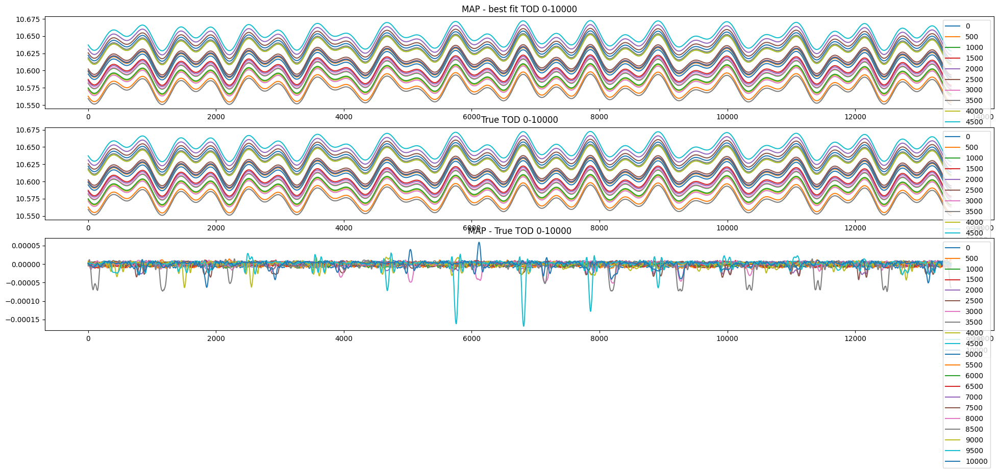

In [37]:
# plot maximum of posterior (mode)
pred_tods = signal_response_tod(samples.pos) # gives time-series

fig, axes = plt.subplots(3, 1, figsize=(8*3, 8))

# for i in [0, 10, 100, 200]:
for i in range(0, len(jax_tods), len(jax_tods)//20):
    im0 = axes[0].plot(pred_tods[i], label=i)
    # im1 = axes[1].plot(tods_map[i], label=i)
    im1 = axes[1].plot(jax_tods[i], label=i)
    im2 = axes[2].plot(pred_tods[i] - jax_tods[i], label=i)
    
axes[0].title.set_text(f'MAP - best fit TOD 0-{i}')
axes[0].legend()
axes[1].title.set_text(f'True TOD 0-{i}')
axes[1].legend()
axes[2].title.set_text(f'MAP - True TOD 0-{i}')
axes[2].legend()

plt.show()